### Trigger Strategy Investigation (Run 2)

This notebook investigates the current Run 2 trigger strategy.

The current trigger configuration is the logical **OR** of the following:

- `DoubleL2Mu23NoVtx_2Cha`
- `DoubleL2Mu23NoVtx_2Cha_NoL2Matched`
- `DoubleL2Mu23NoVtx_2Cha_CosmicSeed_NoL2Matched`
- `DoubleL2Mu25NoVtx_2Cha_Eta2p4`
- `DoubleL2Mu25NoVtx_2Cha_CosmicSeed_Eta2p4`
- `DoubleL2Mu23NoVtx_2Cha_CosmicSeed`

To expand signal acceptance, we also considered additional triggers:

- `Photon200`
- `Mu50`
- `Mu43NoFiltersNoVtx_Photon43_CaloIdL`

Our signal has a large $P_T$ asymmetry, which often results in the **subleading muon failing to meet the 23 GeV threshold**, leading to reduced trigger efficiency. To recover such events, we included the `MuPho` trigger, which helps capture cases where the subleading muon's $P_T$ falls below threshold. Including the `MuPho` trigger can expand the reach of the analysis to the 2017 dataset.

---

The effectiveness of each trigger or combination is visualized using **turn-on curves as a function of transverse decay length ($L_{xy}$)** — the primary tool used to guide trigger strategy decisions.

As a supplemental check, we also include **ΔR-based turn-on curves** to explore angular separation effects


In [25]:
# python
import sys
import os
import importlib
# columnar analysis
from coffea.nanoevents import NanoAODSchema
from coffea import processor
# local 
sidm_path = str(os.getcwd()).split("/sidm")[0]
if sidm_path not in sys.path: sys.path.insert(1, sidm_path)
from sidm.tools import sidm_processor, utilities, scaleout
# always reload local modules to pick up changes during development
importlib.reload(sidm_processor)
importlib.reload(utilities)
# plotting
import matplotlib.pyplot as plt
utilities.set_plot_style()
%matplotlib inline
import warnings
warnings.filterwarnings(action='once')
import numpy as np
import mplhep as hep

In [2]:
client = scaleout.make_dask_client("tls://localhost:8786")
client

Connection method: Direct,
Dashboard: /user/scampbell10@crimson.ua.edu/proxy/8787/status,
Comm: tls://192.168.197.221:8786,Workers: 0
Dashboard: /user/scampbell10@crimson.ua.edu/proxy/8787/status,Total threads: 0
Started: Just now,Total memory: 0 B


In [3]:
## loading in the samples
samples = [
    '2Mu2E_200GeV_0p25GeV_0p01mm',
    '2Mu2E_200GeV_0p25GeV_10p0mm',
    '2Mu2E_200GeV_1p2GeV_0p048mm',
    '2Mu2E_200GeV_1p2GeV_48p0mm',
    '2Mu2E_200GeV_5p0GeV_0p2mm',
    '2Mu2E_200GeV_5p0GeV_200p0mm',
    '2Mu2E_1000GeV_0p25GeV_0p002mm',
    '2Mu2E_1000GeV_0p25GeV_2p0mm',
    '2Mu2E_1000GeV_1p2GeV_0p0096mm',
    '2Mu2E_1000GeV_1p2GeV_9p6mm',
    '2Mu2E_1000GeV_5p0GeV_0p4mm',
    '2Mu2E_1000GeV_5p0GeV_40p0mm',
    '2Mu2E_500GeV_0p25GeV_0p004mm',
    '2Mu2E_500GeV_0p25GeV_4p0mm',
    '2Mu2E_500GeV_1p2GeV_0p019mm',
    '2Mu2E_500GeV_1p2GeV_19p0mm',
    '2Mu2E_500GeV_5p0GeV_0p08mm',
    '2Mu2E_500GeV_5p0GeV_80p0mm'
]

## can set max_files=-1 to run over full statistics 
fileset = utilities.make_fileset(samples, "llpNanoAOD_v2", max_files=-1, location_cfg="signal_2mu2e_v10.yaml")

runner = processor.Runner(
    #executor=processor.IterativeExecutor(),
    executor = processor.DaskExecutor(client=client),
    #executor=processor.FuturesExecutor(),
    schema=NanoAODSchema,
    #maxchunks=1,
)


#channels = ['base', 'basenoVeto', 'basenoPixel']
channels = ['base_noTrigger_no2LJ', 'base_noTrigger'] 
p = sidm_processor.SidmProcessor(
    channels,
    [
        "genA_base",
        'genMu_base',
        'genE_base',
        
    ],
    lj_reco_choices=["0.4"],
    unweighted_hist=True,
)

output = runner.run(fileset, treename="Events", processor_instance=p)
out = output["out"]


def returnLxy(text):
    Lxy = {
        '0.3 cm': ['0p01', '0p2', '0p048'],
        '150 cm': ['5p0', '100p0', '24p0'],
        '300 cm': ['10p0', '200p0', '48p0'],
    }
    for key in Lxy.keys():

        if text in Lxy[key]:
            return key
        else:
            continue
            
legend_entries = [s[6:] for s in samples]

def stringReplace(string):
    if 'p' in string:
        stringNew = string.replace('p', '.')
    else:
        stringNew = string
    return stringNew

Signal not in xs cfg, assuming 1fb#######] | 100% Completed |  3min 24.5s
Signal not in xs cfg, assuming 1fb
Signal not in xs cfg, assuming 1fb
Signal not in xs cfg, assuming 1fb
Signal not in xs cfg, assuming 1fb
Signal not in xs cfg, assuming 1fb
Signal not in xs cfg, assuming 1fb
Signal not in xs cfg, assuming 1fb
Signal not in xs cfg, assuming 1fb
Signal not in xs cfg, assuming 1fb
Signal not in xs cfg, assuming 1fb
Signal not in xs cfg, assuming 1fb
Signal not in xs cfg, assuming 1fb
Signal not in xs cfg, assuming 1fb
Signal not in xs cfg, assuming 1fb
Signal not in xs cfg, assuming 1fb
Signal not in xs cfg, assuming 1fb
Signal not in xs cfg, assuming 1fb


In [4]:
samples200 = [
    '2Mu2E_200GeV_0p25GeV_0p01mm',
    '2Mu2E_200GeV_1p2GeV_0p048mm',
    '2Mu2E_200GeV_5p0GeV_0p2mm',
    '2Mu2E_200GeV_0p25GeV_10p0mm',
    '2Mu2E_200GeV_1p2GeV_48p0mm',
    '2Mu2E_200GeV_5p0GeV_200p0mm',
]

samples500 = [
    '2Mu2E_500GeV_0p25GeV_0p004mm',
    '2Mu2E_500GeV_1p2GeV_0p019mm',
    '2Mu2E_500GeV_5p0GeV_0p08mm',
    '2Mu2E_500GeV_0p25GeV_4p0mm',
    '2Mu2E_500GeV_1p2GeV_19p0mm',
    '2Mu2E_500GeV_5p0GeV_80p0mm',
]

samples1000 = [
    '2Mu2E_1000GeV_0p25GeV_0p002mm',
    '2Mu2E_1000GeV_1p2GeV_0p0096mm',
    '2Mu2E_1000GeV_5p0GeV_0p4mm',
    '2Mu2E_1000GeV_0p25GeV_2p0mm',
    '2Mu2E_1000GeV_1p2GeV_9p6mm',
    '2Mu2E_1000GeV_5p0GeV_40p0mm',
]


In [14]:
def PlotTrigEfficiencies(data, sample_names, trigger_keys, path='./', filename='', mb='', def1=True):
    '''
    This function makes bar plots of the trigger efficiencies per sample
    data: output of the processor 
    sample_names: list of sample names
    trigger_keys: list of triggers to include in the bar plot
    path: output file path for plots
    filename: filename for the plot
    mb: bound state energy
    def1: definition of efficiency
         - def1=True: denominator is just number of events
         - def1=False: denominaotr is Nevents[Passing evt sel]
    '''
    if def1:
        norm = 'Num Events'
    else:
        norm = 'Num Events + Evt Sel'
    

    
    triggerCounts = {
    sample: {
        'Num Events': data[sample]['counters']['0.4']['base_noTrigger_no2LJ']['Num Evts'],
        'Num Events + Evt Sel': data[sample]['counters']['0.4']['base_noTrigger']['Num Evts'],
        'Passing Current Triggers': data[sample]['counters']['0.4']['base_noTrigger_no2LJ']['Passing Current Triggers'],
        'Passing Current Triggers + Mu50': data[sample]['counters']['0.4']['base_noTrigger_no2LJ']['Passing Current Triggers + Mu50'],
        'Passing Current Triggers + Photon200': data[sample]['counters']['0.4']['base_noTrigger_no2LJ']['Passing Current Triggers + Photon200'],
        'Passing Current Triggers + MuPho': data[sample]['counters']['0.4']['base_noTrigger_no2LJ']['Passing Current Triggers + MuPho'],
        'Passing MuPho Only': data[sample]['counters']['0.4']['base_noTrigger_no2LJ']['Passing MuPho Only'],
        'Passing Current Triggers + Evt Sel':  data[sample]['counters']['0.4']['base_noTrigger']['Passing Current Triggers'],
        'Passing Current Triggers + Mu50 + Evt Sel': data[sample]['counters']['0.4']['base_noTrigger']['Passing Current Triggers + Mu50'],
        'Passing Current Triggers + Photon200 + Evt Sel': data[sample]['counters']['0.4']['base_noTrigger']['Passing Current Triggers + Photon200'],
        'Passing Current Triggers + MuPho + Evt Sel': data[sample]['counters']['0.4']['base_noTrigger']['Passing Current Triggers + MuPho'],
        'Passing MuPho Only + Evt Sel': data[sample]['counters']['0.4']['base_noTrigger']['Passing MuPho Only'],   
    } for sample in sample_names if mb in sample
    }
    
    
    n_triggers = len(trigger_keys)
    sampNames = [sample for sample in sample_names if mb in sample]
    n_samples = len(sampNames)
   
    # Initialize the normalized trigger data matrix
    trigger_data = np.zeros((n_triggers, n_samples))
    
    # Fill trigger_data with normalized counts per sample
    for sample_idx, sample_name in enumerate(triggerCounts.keys()):
        sample_dict = triggerCounts[sample_name]
        num_events = (np.array(sample_dict[norm]))
        for trig_idx, trig_key in enumerate(trigger_keys):
            trig_count = np.array(sample_dict[trig_key])
            trigger_data[trig_idx, sample_idx] = trig_count / num_events if num_events else 0

    # Create the plot
    fig, ax = plt.subplots(figsize=(30, 15))
    
    ind = np.arange(n_triggers)
    width = 0.8 / n_samples
    
    # Plot grouped bars for each sample
    bars = []
    for i in range(n_samples):
        bar_group = ax.bar(ind + i * width, trigger_data[:, i], width, label=sampNames[i])
        bars.append(bar_group)
    
    # Set x ticks and labels
    ax.set_xticks(ind + width * (n_samples - 1) / 2)
    ax.set_xticklabels(trigger_keys, rotation=90, fontsize=15)
    hep.cms.label(ax=ax)
    # Extend y-axis beyond 1 for better space for annotations
    ax.set_ylim(0, 1.2)
    ax.set_ylabel('Normalized Trigger Count', fontsize=18)
    ax.set_title(f'Cumulative Trigger Efficiencies $m_B$ = {mb}', fontsize=22)
    
    # Add efficiency values above each bar
    for bar_group in bars:
        for bar in bar_group:
            height = bar.get_height()
            if height > 0:
                ax.text(
                    bar.get_x() + bar.get_width() / 2,
                    height + 0.02,
                    f'{height:.2f}',
                    ha='center',
                    va='bottom',
                    fontsize=15,
                    rotation=90
                )
    
    # Add legend
    ax.legend(loc='upper right', fontsize='small')
    
    # Final layout and export
    plt.tight_layout()
    plt.savefig(f'{path}/{filename}.png', facecolor='w', dpi=300)
    plt.show()
    plt.clf()
    plt.close()

In [15]:
def plotTriggerTurnOnCurves(
    data,
    sampleNames,
    path='./',
    mb='',
    prompt=False,
    electron=False,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=0,
    label_suffix='',
    denName=None,
    passingCurrentTrigger=None,
    passingCurrentPlusMu50=None,
    passingCurrentPlusPho200=None,
    passingCurrentPlusMuPho=None,
    passingMuPhoOnly=None,
    maxRange=None
):
    """
    This function plots the trigger efficiency for displaced samples based on the specified cuts.
    
    Parameters:
    - data: The input data object that contains the histograms for different samples.
    - sampleNames: A list of sample names used for plotting.
    - path: The path where the generated plot will be saved (default is current directory).
    - mb: A string representing the specific bound state energy (used for naming the plot).
    - prompt: A boolean flag indicating whether to use "prompt" or "displaced" samples (affects cuts).
    - electron: A boolean flag to help with naming if using electron histograms
    - isLxy: a boolean flag to help with naming if the variable is Lxy else it is dR (not currently used)
    - channel_den_index: The index for the denominator histograms for efficiency calculation.
                        - 0: Total number of generated events.
                        - 1: Number of events passing event selection.
    - channel_num_index: The index for the numerator histograms for efficiency calculation.
                        - 0: Number of events passing the trigger.
                        - 1: Number of events passing both trigger and event selection.
    - label_suffix: A string that will be added to each plot label to differentiate between different configurations (not currently used).
    - denName: Name of the histogram for the denominator (background), used for efficiency calculation.
    - passingCurrentTrigger: Name of the histogram for events passing the "current" trigger.
    - passingCurrentPlusMu50: Name of the histogram for events passing the "current" trigger + Mu50 trigger.
    - passingCurrentPlusPho200: Name of the histogram for events passing the "current" trigger + Photon200 trigger.
    - passingCurrentPlusMuPho: Name of the histogram for events passing the "current" trigger + MuPho trigger.
    - passingMuPhoOnly: Name of the histogram for events passing the MuPhoOnly trigger.
    - maxRange: The maximum value for the x-axis of the plot (default to 700 if not provided).
    """

    # Set default values for each histogram name based on the `prompt` flag.
    # These values are used to identify the corresponding histograms in the dataset.
    
    samples = sampleNames[:3] if prompt else sampleNames[3:]
    # Set the maximum range for the x-axis. This is used to control the x-axis limits of the plot.
    # If `prompt` is True, the max range is set to 10 (low range); otherwise, it is set to 700 (full range).
    if maxRange is None:
        maxRange = 700 if not prompt else 10

    # Create a subplot with 3 rows, each showing the efficiency for one of the displaced sample categories.
    fig, axs = plt.subplots(3, 1, figsize=(36, 20), sharex=True)

    # Loop over the displaced sample names to create a plot for each sample
    for i, sample in enumerate(samples):
        ax = axs[i]
        
        # Set the y-axis limit from 0 to 1.2 (efficiency range)
        ax.set_ylim(0, 1.2)
        
        # Set the x-axis limit to the maxRange, which controls how far along the x-axis we plot.
        ax.set_xlim(0, maxRange)

        # Get the histograms for this sample
        hists = out[sample]["hists"]
        
        # Fetch the denominator (background) histogram using the specified channel_den_index.
        h_den = hists[denName][channels[channel_den_index], :]

        # Initialize an empty list to store the efficiency and error for each trigger selection.
        eff_list = []
        
        # Define the different trigger configurations and their labels.
        labels = [
            (passingCurrentTrigger, 'Current'),
            (passingCurrentPlusMu50, 'Current + Mu50'),
            (passingCurrentPlusMuPho, 'Current + MuPho'),
            (passingCurrentPlusPho200, 'Current + Photon200'),
            (passingMuPhoOnly, 'MuPho Only'),
        ]

        # Loop through each trigger configuration and calculate the efficiency.
        for hist_name, label in labels:
            # Fetch the numerator (signal) histogram using the specified channel_num_index.
            h_num = hists[hist_name][channels[channel_num_index], :]
            
            # Calculate the efficiency and errors using the `get_eff_hist` utility function.
            eff, err = utilities.get_eff_hist(h_num, h_den)
            
            # Store the efficiency, errors, and label for later plotting.
            eff_list.append((eff, err, f"{sample} - {label}{label_suffix}"))

        # Plot each efficiency on the current axis.
        for eff, err, label in eff_list:
            hep.histplot(eff, yerr=err, label=label, ax=ax)

        # Add CMS label to the plot for aesthetic purposes.
        hep.cms.label(ax=ax)
        
        # Show the legend with labels for each trigger configuration.
        ax.legend()

    # Construct the file name for saving the plot based on parameters.
    strs = 'mumu' if not electron else 'ee'
    var1 = 'lxy' if isLxy else 'dR'
    suffix = f"_denCh{channel_den_index}_numCh{channel_num_index}{'_prompt' if prompt else '_displaced'}"
    filename = f'{path}/zd_{strs}_{var1}_reco_eff_{mb}{suffix}.png'
    
    # Save the plot to the specified path.
    plt.savefig(filename, dpi=300, facecolor='w')
    
    # Tighten the layout to avoid overlap and show the plot.
    plt.tight_layout()
    plt.show()
    
    # Clean up the plot to free memory.
    plt.clf()
    plt.close()


In [16]:
def plotDRTurnOnCurves(data, sampleNames, path='./',  mb='', prompt=False, electron=False, numKey = 1, denKey = 0):
    """
    Plot the trigger turn-on curves in ΔR for different signal samples.
    
    Parameters:
        data (dict): The output dictionary from the SIDM processor.
        sampleNames (list of str): List of sample names to use for labeling and histogram lookup.
        path (str): Directory path where the plot image will be saved.
        prompt (bool): If True, use prompt samples (first 3 in sampleNames); otherwise, use displaced samples.
        electron (bool): If True, plot for Z_d → ee; otherwise, plot for Z_d → μμ.
        numKey (int): Index selecting the channel used for the numerator.
            - 0: Number of events passing the trigger.
            - 1: Number of events passing both trigger and event selection.
        denKey (int): Index selecting the channel used for the denominator.
            - 0: Total number of generated events.
            - 1: Number of events passing event selection.
    """

    samples = sampleNames[:3] if prompt else sampleNames[3:]
    mainKey = 'muon' if not electron else 'electron'
    
    hist_keys = {
    'muon': {
        '0p25': {
            'denName': "genMusDR_XlowRange",
            'passingCurrentTrigger': "genAToMus_passingCurrentTrigger_dR_XlowRange",
            'passingCurrentPlusMu50': "genAToMus_passingCurrentTriggerPlusMu50_dR_XlowRange",
            'passingCurrentPlusPho200': "genAToMus_passingCurrentTriggerPlusPhoton200_dR_XlowRange",
            'passingCurrentPlusMuPho':  "genAToMus_passingCurrentTriggerPlusMuPho_dR_XlowRange",
            'passingMuPhoOnly': "genAToMus_passingMuPhoOnly_dR_XlowRange",
        },
        '1p2': {
            'denName': "genMusDR_lowRange",
            'passingCurrentTrigger': "genAToMus_passingCurrentTrigger_dR_lowRange",
            'passingCurrentPlusMu50': "genAToMus_passingCurrentTriggerPlusMu50_dR_lowRange",
            'passingCurrentPlusPho200': "genAToMus_passingCurrentTriggerPlusPhoton200_dR_lowRange",
            'passingCurrentPlusMuPho':  "genAToMus_passingCurrentTriggerPlusMuPho_dR_lowRange",
            'passingMuPhoOnly': "genAToMus_passingMuPhoOnly_dR_lowRange",
        },
        '5p0': {
            'denName': "genMusDR",
            'passingCurrentTrigger': "genAToMus_passingCurrentTrigger_dR",
            'passingCurrentPlusMu50': "genAToMus_passingCurrentTriggerPlusMu50_dR",
            'passingCurrentPlusPho200': "genAToMus_passingCurrentTriggerPlusPhoton200_dR",
            'passingCurrentPlusMuPho':  "genAToMus_passingCurrentTriggerPlusMuPho_dR",
            'passingMuPhoOnly': "genAToMus_passingMuPhoOnly_dR",
        },
    },
    'electron': {
        '0p25': {
            'denName': "genEsDR_XlowRange",
            'passingCurrentTrigger': "genAToEs_passingCurrentTrigger_dR_XlowRange",
            'passingCurrentPlusMu50': "genAToEs_passingCurrentTriggerPlusMu50_dR_XlowRange",
            'passingCurrentPlusPho200': "genAToEs_passingCurrentTriggerPlusPhoton200_dR_XlowRange",
            'passingCurrentPlusMuPho':  "genAToEs_passingCurrentTriggerPlusMuPho_dR_XlowRange",
            'passingMuPhoOnly': "genAToEs_passingMuPhoOnly_dR_XlowRange",
        },
        '1p2': {
            'denName': "genEsDR_lowRange",
            'passingCurrentTrigger': "genAToEs_passingCurrentTrigger_dR_lowRange",
            'passingCurrentPlusMu50': "genAToEs_passingCurrentTriggerPlusMu50_dR_lowRange",
            'passingCurrentPlusPho200': "genAToEs_passingCurrentTriggerPlusPhoton200_dR_lowRange",
            'passingCurrentPlusMuPho':  "genAToEs_passingCurrentTriggerPlusMuPho_dR_lowRange",
            'passingMuPhoOnly': "genAToEs_passingMuPhoOnly_dR_lowRange",
        },
        '5p0': {
            'denName': "genEsDR",
            'passingCurrentTrigger': "genAToEs_passingCurrentTrigger_dR",
            'passingCurrentPlusMu50': "genAToEs_passingCurrentTriggerPlusMu50_dR",
            'passingCurrentPlusPho200': "genAToEs_passingCurrentTriggerPlusPhoton200_dR",
            'passingCurrentPlusMuPho':  "genAToEs_passingCurrentTriggerPlusMuPho_dR",
            'passingMuPhoOnly': "genAToEs_passingMuPhoOnly_dR",
        },
    },
    }
        
    trigger_labels = {
        'passingCurrentTrigger': 'Current',
        'passingCurrentPlusMu50': 'Current + Mu50',
        'passingCurrentPlusPho200': 'Current + Photon200',
        'passingCurrentPlusMuPho': 'Current + MuPho',
        'passingMuPhoOnly': 'MuPho Only'
    }

    # Dynamically create subplots based on number of samples
    n_samples = len(samples)
    fig, axs = plt.subplots(n_samples, 1, figsize=(30, 7 * n_samples), sharex=False)
    if n_samples == 1:
        axs = [axs]  # Make iterable

    for i, sample in enumerate(samples):
        sampleKey = sample.split('GeV')[1].split('_')[-1]
        ax = axs[i]

        ax.set_ylim(0, 1.2)

        den_name = hist_keys[mainKey][sampleKey]['denName']
        h_den = data[sample]["hists"][den_name][channels[denKey], :]

        for trig_key, label in trigger_labels.items():
            num_name = hist_keys[mainKey][sampleKey][trig_key]
            h_num = data[sample]["hists"][num_name][channels[numKey], :]
            eff, errors = utilities.get_eff_hist(h_num, h_den)
            hep.histplot(eff, yerr=errors, label=f'{samples[i]} - {label}', ax=ax)

        hep.cms.label(ax=ax)
        ax.legend()

    suffix = f"numChannel{numKey}_denChannel{denKey}{'_prompt' if prompt else '_displaced'}"
    particle = 'mumu' if not electron else 'ee'
    plt.savefig(f'{path}/zd_{particle}_{mb}_dR_turnOnCurve_{suffix}.png', dpi=300, facecolor='w')
    plt.tight_layout()
    plt.show()
    plt.clf()
    plt.close()

# Cumulative Trigger Efficiency Bar Plots

## Plotting Cumulative Trigger Effiencies
## efficiency = $N_{events}$[Passing Trigger]/$N_{events}$

In [24]:
trigger_keys = [
    'Passing Current Triggers',
    'Passing Current Triggers + Mu50',
    'Passing Current Triggers + Photon200',
    'Passing Current Triggers + MuPho',
    'Passing MuPho Only',
]

# Configuration
path = './TriggerEfficiencyPlots'
if not os.path.exists(path):
    os.mkdir(path)

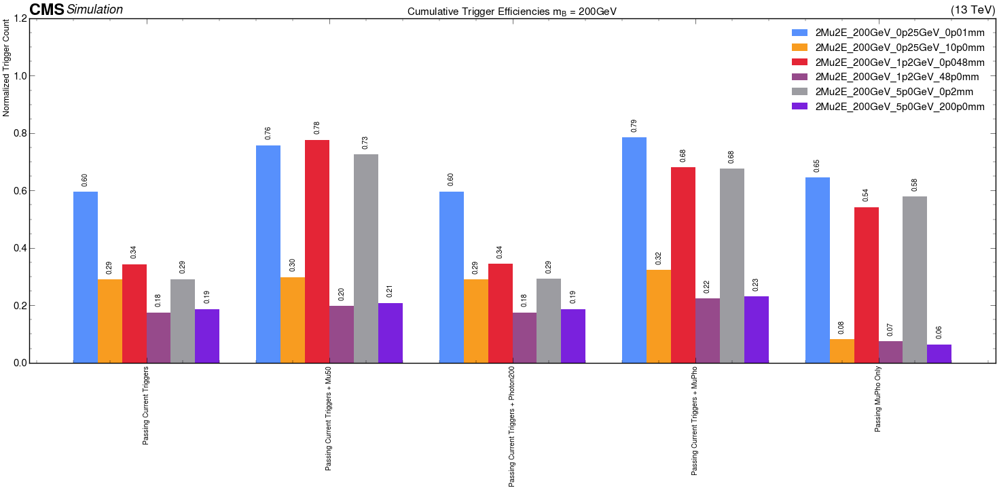

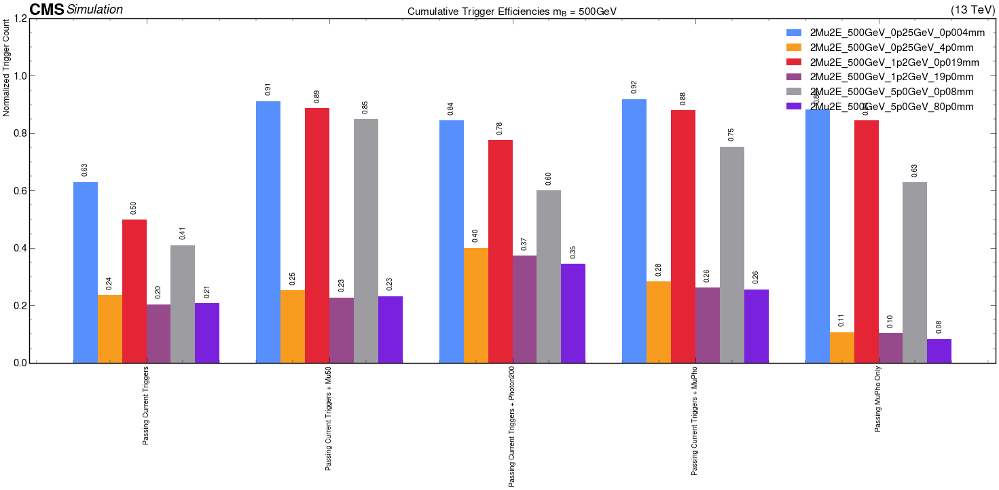

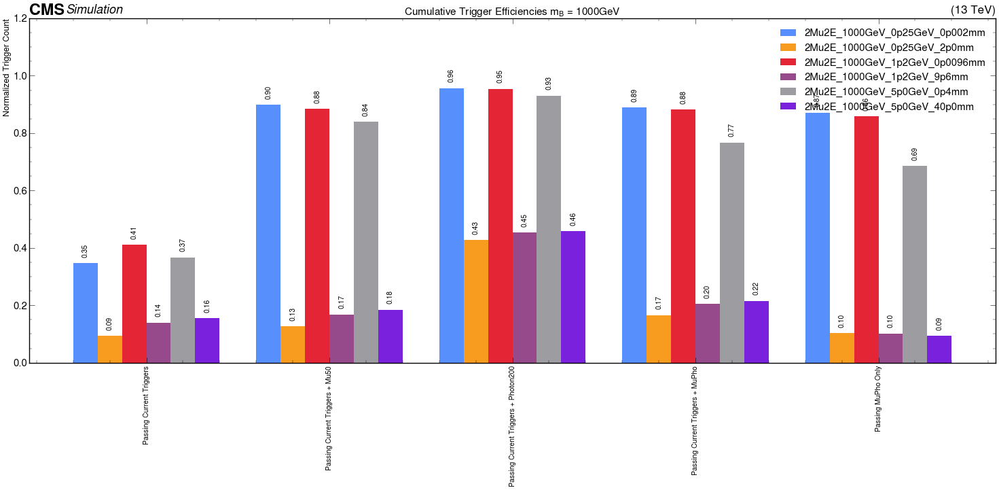

In [19]:
PlotTrigEfficiencies(data=out, sample_names=samples, trigger_keys=trigger_keys, path=path, filename='TriggerEfficiencies_200GeV_NoEvtSelection', mb='200GeV', def1=True)
PlotTrigEfficiencies(data=out, sample_names=samples, trigger_keys=trigger_keys, path=path, filename='TriggerEfficiencies_500GeV_NoEvtSelection', mb='500GeV', def1=True)
PlotTrigEfficiencies(data=out, sample_names=samples, trigger_keys=trigger_keys, path=path, filename='TriggerEfficiencies_1000GeV_NoEvtSelection', mb='1000GeV', def1=True)

## Plotting Cumulative Trigger Effiencies
## efficiency = $N_{events}$[Passing Trigger & Evt Selection]/$N_{events}$

In [21]:
trigger_keys = [
    'Passing Current Triggers + Evt Sel',
    'Passing Current Triggers + Mu50 + Evt Sel',
    'Passing Current Triggers + Photon200 + Evt Sel',
    'Passing Current Triggers + MuPho + Evt Sel',
    'Passing MuPho Only + Evt Sel',
]

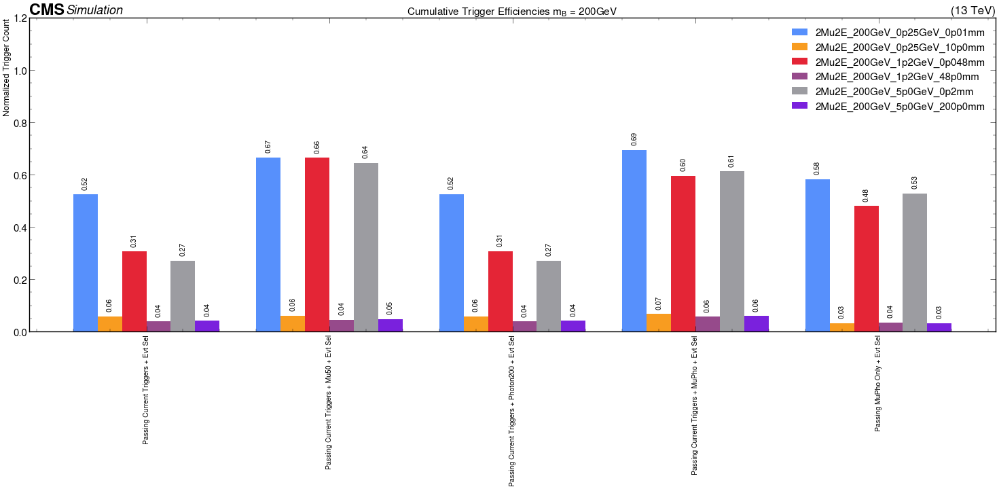

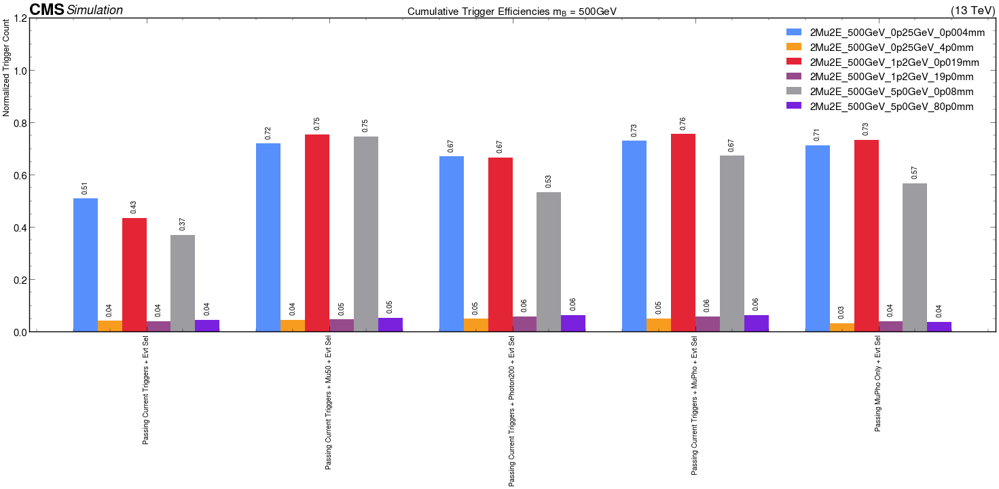

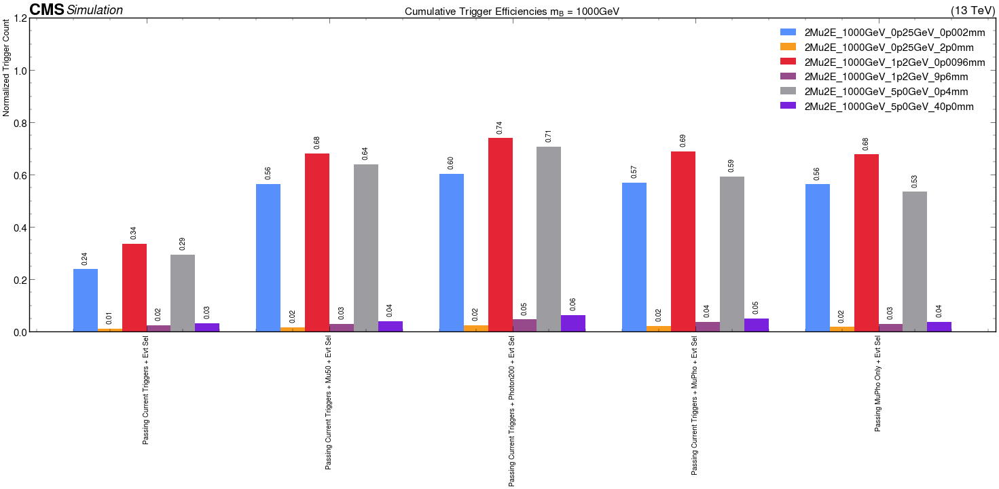

In [23]:
PlotTrigEfficiencies(data=out, sample_names=samples, trigger_keys=trigger_keys, path=path, filename='TriggerEfficiencies_200GeV_EvtSelection_denom_Nevents_passingEvt', mb='200GeV', def1=True)
PlotTrigEfficiencies(data=out, sample_names=samples, trigger_keys=trigger_keys, path=path, filename='TriggerEfficiencies_500GeV_EvtSelection_denom_Nevents_passingEvt', mb='500GeV', def1=True)
PlotTrigEfficiencies(data=out, sample_names=samples, trigger_keys=trigger_keys, path=path, filename='TriggerEfficiencies_1000GeV_EvtSelection_denom_Nevents_passingEvt', mb='1000GeV', def1=True)

# $L_{xy}$ turn-on curves

## Plotting Trigger Turn on curves for $Z_d$ -> $\mu \mu$
##  efficiency = $N_{events}$[passing trigger]/$N_{events}$

In [26]:
# Configuration
path = './TriggerEfficiencyPlots-Lxy'
if not os.path.exists(path):
    os.mkdir(path)

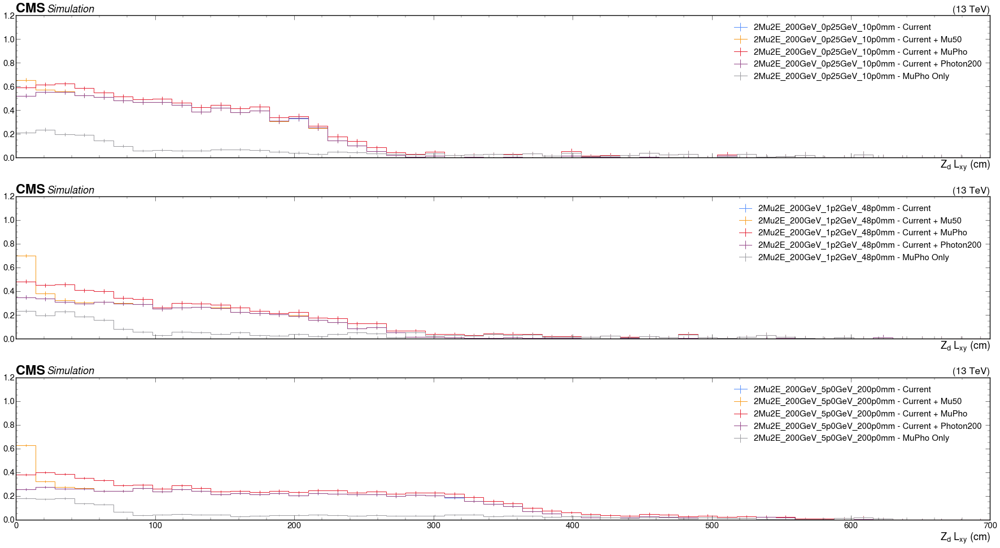

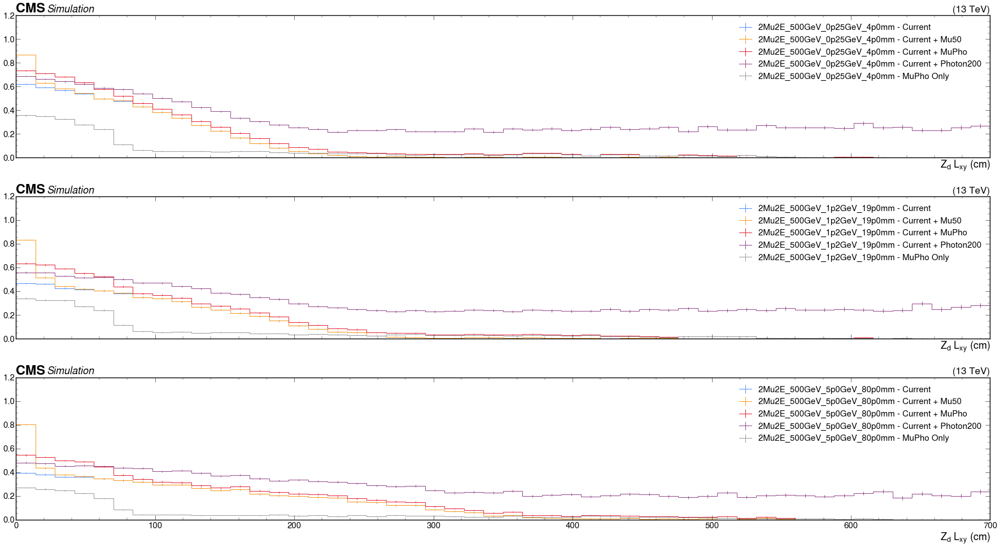

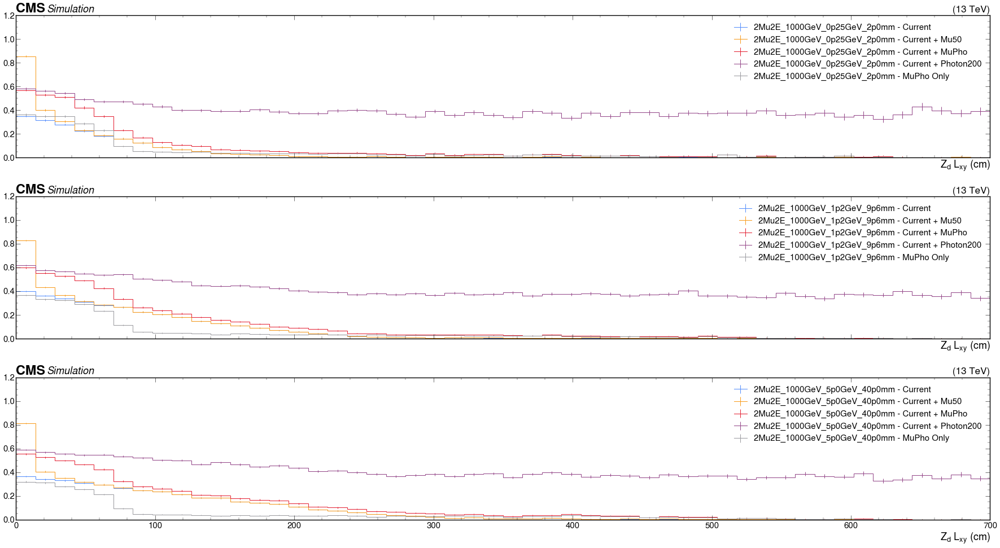

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals


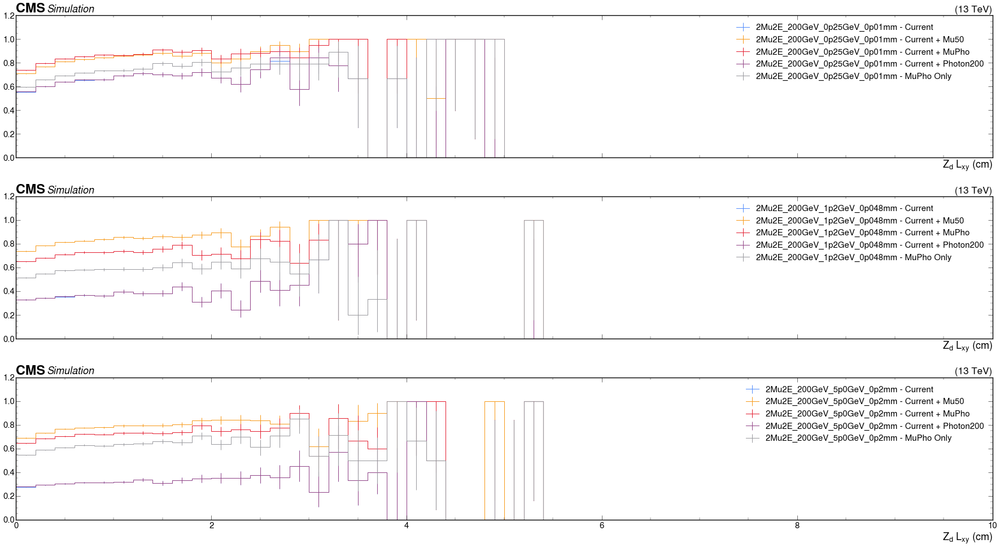

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals


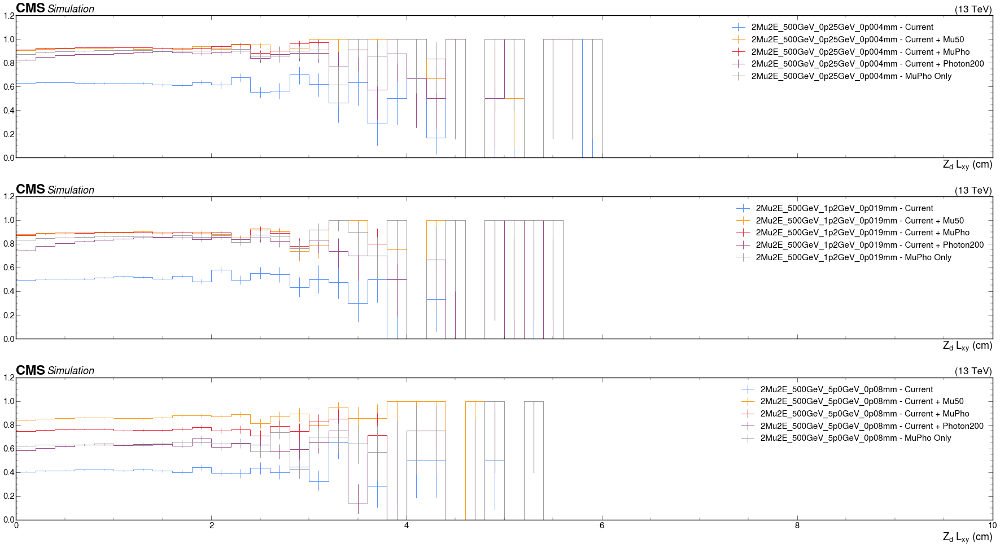

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals


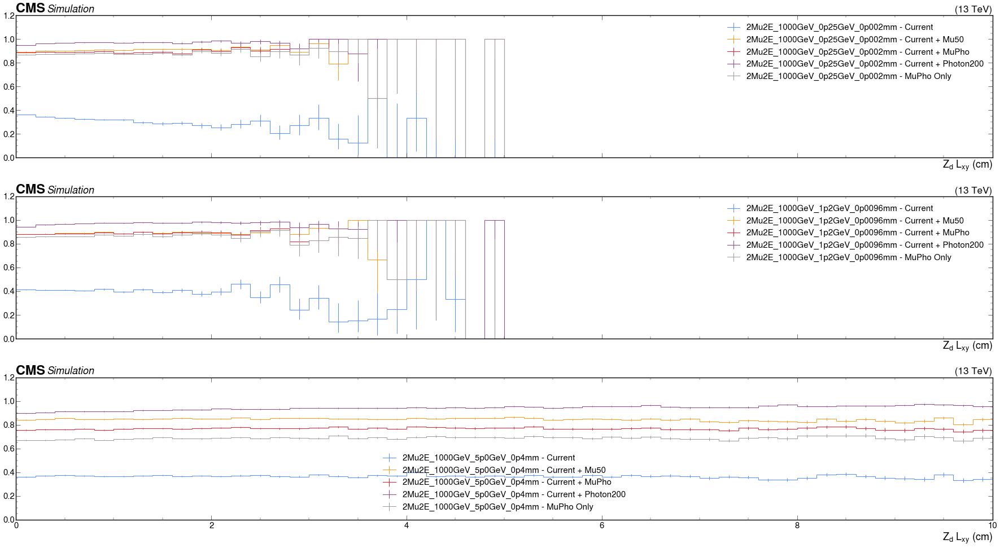

In [27]:
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples200,
    path=path,
    mb='200',
    prompt=False,
    electron=False,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=0,
    label_suffix='',
    denName='genAs_toMu_lxy',
    passingCurrentTrigger="genAToMus_passingCurrentTrigger_lxy",
    passingCurrentPlusMu50="genAToMus_passingCurrentTriggerPlusMu50_lxy",
    passingCurrentPlusPho200="genAToMus_passingCurrentTriggerPlusPhoton200_lxy",
    passingCurrentPlusMuPho="genAToMus_passingCurrentTriggerPlusMuPho_lxy",
    passingMuPhoOnly="genAToMus_passingMuPhoOnly_lxy",
    maxRange=700,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples500,
    path=path,
    mb='500',
    prompt=False,
    electron=False,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=0,
    label_suffix='',
    denName='genAs_toMu_lxy',
    passingCurrentTrigger="genAToMus_passingCurrentTrigger_lxy",
    passingCurrentPlusMu50="genAToMus_passingCurrentTriggerPlusMu50_lxy",
    passingCurrentPlusPho200="genAToMus_passingCurrentTriggerPlusPhoton200_lxy",
    passingCurrentPlusMuPho="genAToMus_passingCurrentTriggerPlusMuPho_lxy",
    passingMuPhoOnly="genAToMus_passingMuPhoOnly_lxy",
    maxRange=700,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples1000,
    path=path,
    mb='1000',
    prompt=False,
    electron=False,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=0,
    label_suffix='',
    denName='genAs_toMu_lxy',
    passingCurrentTrigger="genAToMus_passingCurrentTrigger_lxy",
    passingCurrentPlusMu50="genAToMus_passingCurrentTriggerPlusMu50_lxy",
    passingCurrentPlusPho200="genAToMus_passingCurrentTriggerPlusPhoton200_lxy",
    passingCurrentPlusMuPho="genAToMus_passingCurrentTriggerPlusMuPho_lxy",
    passingMuPhoOnly="genAToMus_passingMuPhoOnly_lxy",
    maxRange=700,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples200,
    path=path,
    mb='200',
    prompt=True,
    electron=False,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=0,
    label_suffix='',
    denName='genAs_toMu_lxy_lowRange',
    passingCurrentTrigger="genAToMus_passingCurrentTrigger_lxy_lowRange",
    passingCurrentPlusMu50="genAToMus_passingCurrentTriggerPlusMu50_lxy_lowRange",
    passingCurrentPlusPho200="genAToMus_passingCurrentTriggerPlusPhoton200_lxy_lowRange",
    passingCurrentPlusMuPho="genAToMus_passingCurrentTriggerPlusMuPho_lxy_lowRange",
    passingMuPhoOnly="genAToMus_passingMuPhoOnly_lxy_lowRange",
    maxRange=10,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples500,
    path=path,
    mb='500',
    prompt=True,
    electron=False,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=0,
    label_suffix='',
    denName='genAs_toMu_lxy_lowRange',
    passingCurrentTrigger="genAToMus_passingCurrentTrigger_lxy_lowRange",
    passingCurrentPlusMu50="genAToMus_passingCurrentTriggerPlusMu50_lxy_lowRange",
    passingCurrentPlusPho200="genAToMus_passingCurrentTriggerPlusPhoton200_lxy_lowRange",
    passingCurrentPlusMuPho="genAToMus_passingCurrentTriggerPlusMuPho_lxy_lowRange",
    passingMuPhoOnly="genAToMus_passingMuPhoOnly_lxy_lowRange",
    maxRange=10,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples1000,
    path=path,
    mb='1000',
    prompt=True,
    electron=False,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=0,
    label_suffix='',
    denName='genAs_toMu_lxy_lowRange',
    passingCurrentTrigger="genAToMus_passingCurrentTrigger_lxy_lowRange",
    passingCurrentPlusMu50="genAToMus_passingCurrentTriggerPlusMu50_lxy_lowRange",
    passingCurrentPlusPho200="genAToMus_passingCurrentTriggerPlusPhoton200_lxy_lowRange",
    passingCurrentPlusMuPho="genAToMus_passingCurrentTriggerPlusMuPho_lxy_lowRange",
    passingMuPhoOnly="genAToMus_passingMuPhoOnly_lxy_lowRange",
    maxRange=10,
)

## Plotting Trigger Turn on curves for $Z_d$ -> $\mu \mu$
##  efficiency = $N_{events}$[passing trigger & evt selection]/$N_{events}$

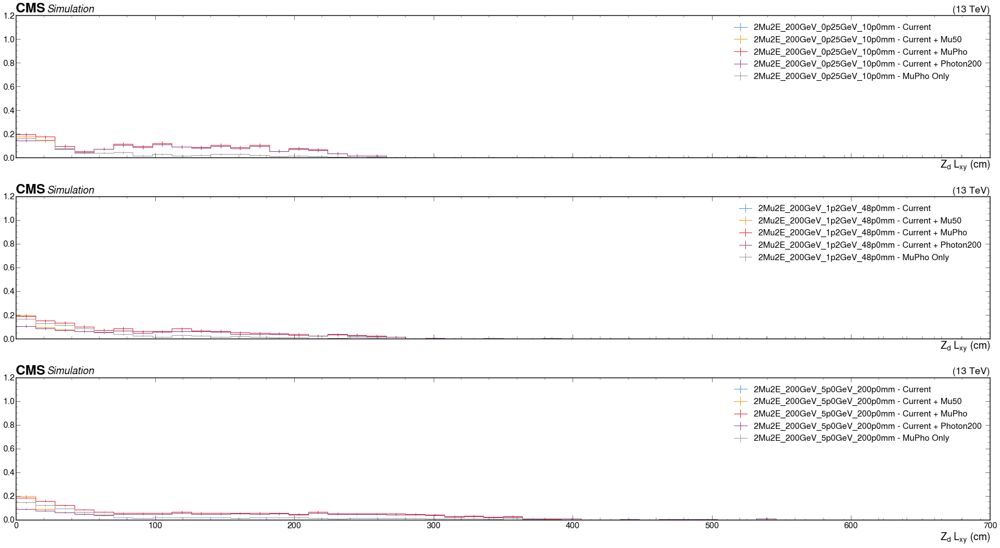

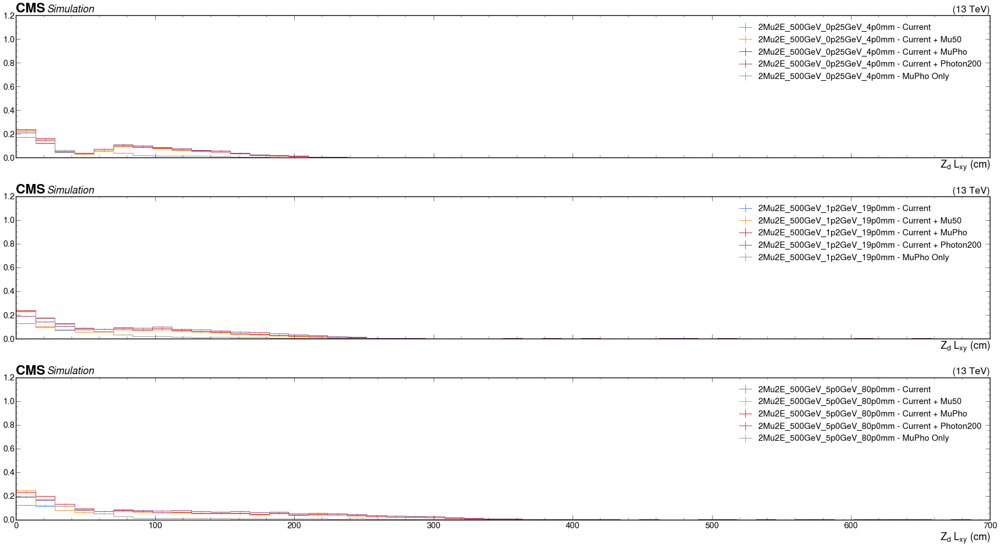

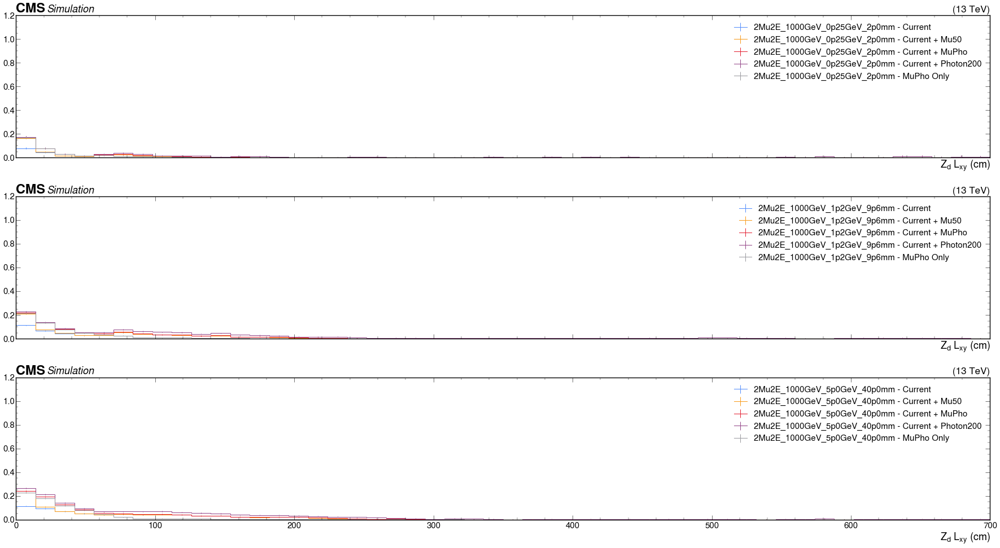

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals


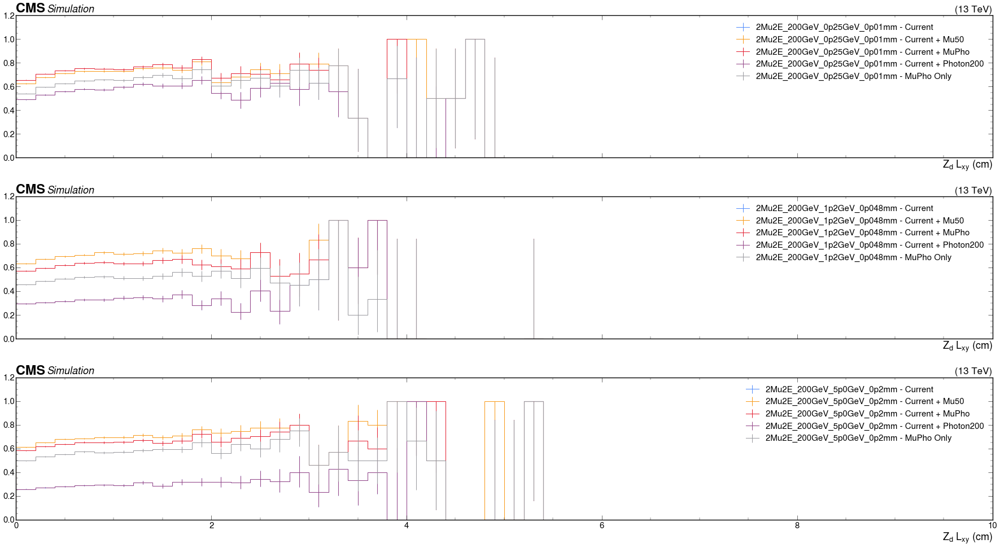

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals


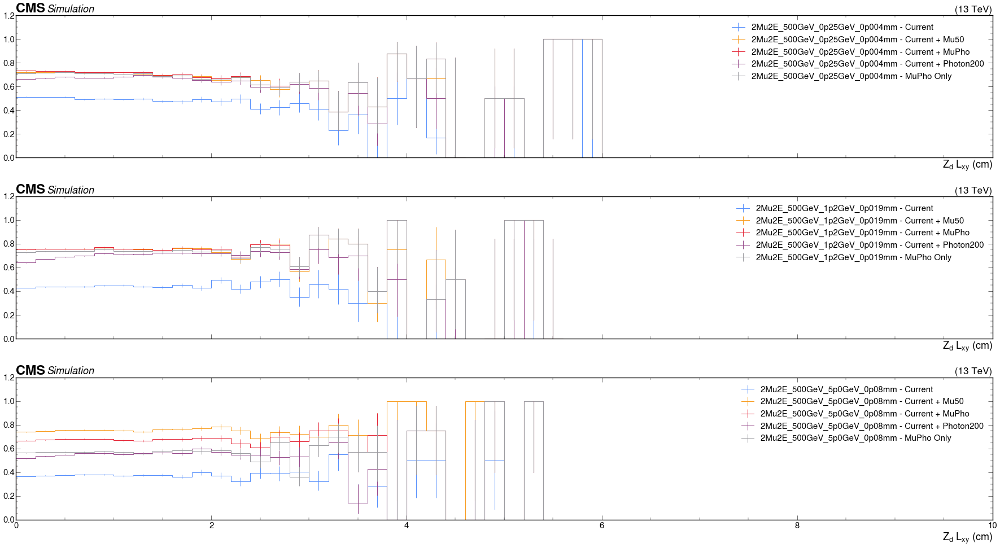

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals


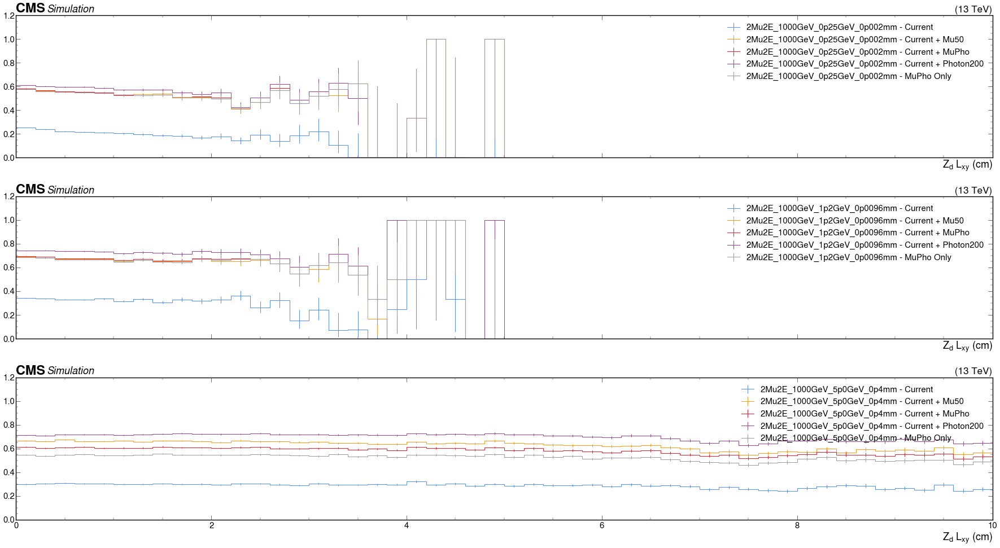

In [28]:
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples200,
    path=path,
    mb='200',
    prompt=False,
    electron=False,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=1,
    label_suffix='',
    denName='genAs_toMu_lxy',
    passingCurrentTrigger="genAToMus_passingCurrentTrigger_lxy",
    passingCurrentPlusMu50="genAToMus_passingCurrentTriggerPlusMu50_lxy",
    passingCurrentPlusPho200="genAToMus_passingCurrentTriggerPlusPhoton200_lxy",
    passingCurrentPlusMuPho="genAToMus_passingCurrentTriggerPlusMuPho_lxy",
    passingMuPhoOnly="genAToMus_passingMuPhoOnly_lxy",
    maxRange=700,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples500,
    path=path,
    mb='500',
    prompt=False,
    electron=False,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=1,
    label_suffix='',
    denName='genAs_toMu_lxy',
    passingCurrentTrigger="genAToMus_passingCurrentTrigger_lxy",
    passingCurrentPlusMu50="genAToMus_passingCurrentTriggerPlusMu50_lxy",
    passingCurrentPlusPho200="genAToMus_passingCurrentTriggerPlusPhoton200_lxy",
    passingCurrentPlusMuPho="genAToMus_passingCurrentTriggerPlusMuPho_lxy",
    passingMuPhoOnly="genAToMus_passingMuPhoOnly_lxy",
    maxRange=700,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples1000,
    path=path,
    mb='1000',
    prompt=False,
    electron=False,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=1,
    label_suffix='',
    denName='genAs_toMu_lxy',
    passingCurrentTrigger="genAToMus_passingCurrentTrigger_lxy",
    passingCurrentPlusMu50="genAToMus_passingCurrentTriggerPlusMu50_lxy",
    passingCurrentPlusPho200="genAToMus_passingCurrentTriggerPlusPhoton200_lxy",
    passingCurrentPlusMuPho="genAToMus_passingCurrentTriggerPlusMuPho_lxy",
    passingMuPhoOnly="genAToMus_passingMuPhoOnly_lxy",
    maxRange=700,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples200,
    path=path,
    mb='200',
    prompt=True,
    electron=False,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=1,
    label_suffix='',
    denName='genAs_toMu_lxy_lowRange',
    passingCurrentTrigger="genAToMus_passingCurrentTrigger_lxy_lowRange",
    passingCurrentPlusMu50="genAToMus_passingCurrentTriggerPlusMu50_lxy_lowRange",
    passingCurrentPlusPho200="genAToMus_passingCurrentTriggerPlusPhoton200_lxy_lowRange",
    passingCurrentPlusMuPho="genAToMus_passingCurrentTriggerPlusMuPho_lxy_lowRange",
    passingMuPhoOnly="genAToMus_passingMuPhoOnly_lxy_lowRange",
    maxRange=10,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples500,
    path=path,
    mb='500',
    prompt=True,
    electron=False,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=1,
    label_suffix='',
    denName='genAs_toMu_lxy_lowRange',
    passingCurrentTrigger="genAToMus_passingCurrentTrigger_lxy_lowRange",
    passingCurrentPlusMu50="genAToMus_passingCurrentTriggerPlusMu50_lxy_lowRange",
    passingCurrentPlusPho200="genAToMus_passingCurrentTriggerPlusPhoton200_lxy_lowRange",
    passingCurrentPlusMuPho="genAToMus_passingCurrentTriggerPlusMuPho_lxy_lowRange",
    passingMuPhoOnly="genAToMus_passingMuPhoOnly_lxy_lowRange",
    maxRange=10,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples1000,
    path=path,
    mb='1000',
    prompt=True,
    electron=False,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=1,
    label_suffix='',
    denName='genAs_toMu_lxy_lowRange',
    passingCurrentTrigger="genAToMus_passingCurrentTrigger_lxy_lowRange",
    passingCurrentPlusMu50="genAToMus_passingCurrentTriggerPlusMu50_lxy_lowRange",
    passingCurrentPlusPho200="genAToMus_passingCurrentTriggerPlusPhoton200_lxy_lowRange",
    passingCurrentPlusMuPho="genAToMus_passingCurrentTriggerPlusMuPho_lxy_lowRange",
    passingMuPhoOnly="genAToMus_passingMuPhoOnly_lxy_lowRange",
    maxRange=10,
)

## Plotting Trigger Turn on curves for $Z_d$ -> ee
##  efficiency = $N_{events}$[passing trigger]/$N_{events}$

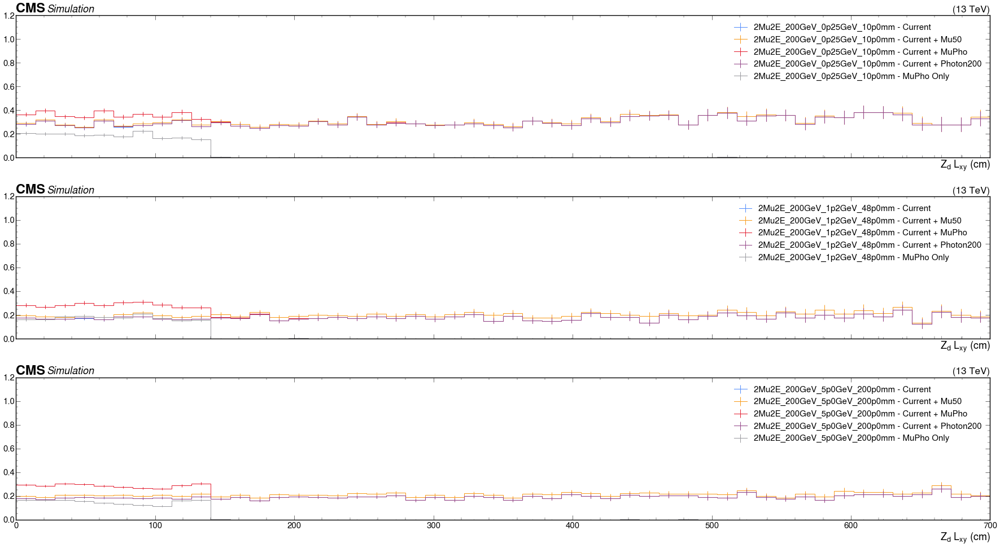

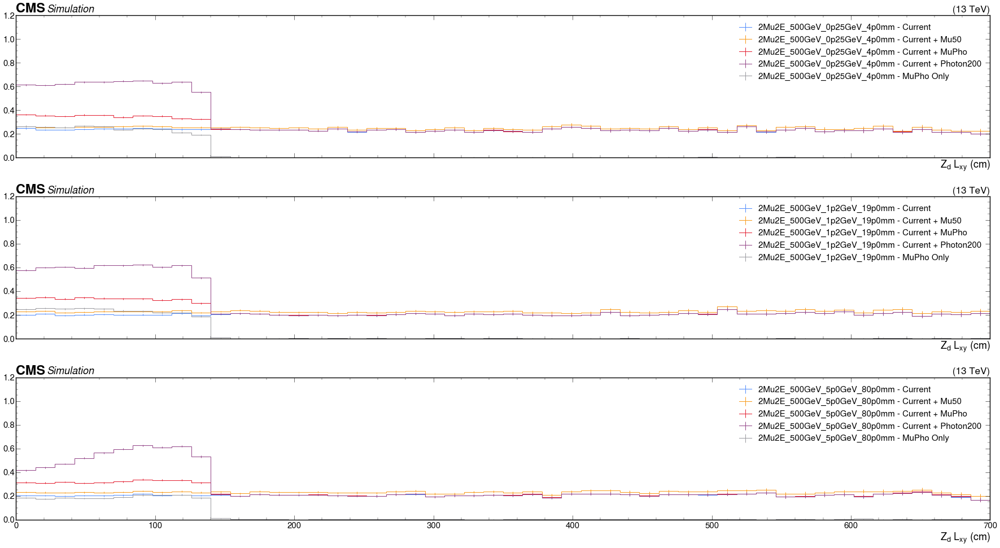

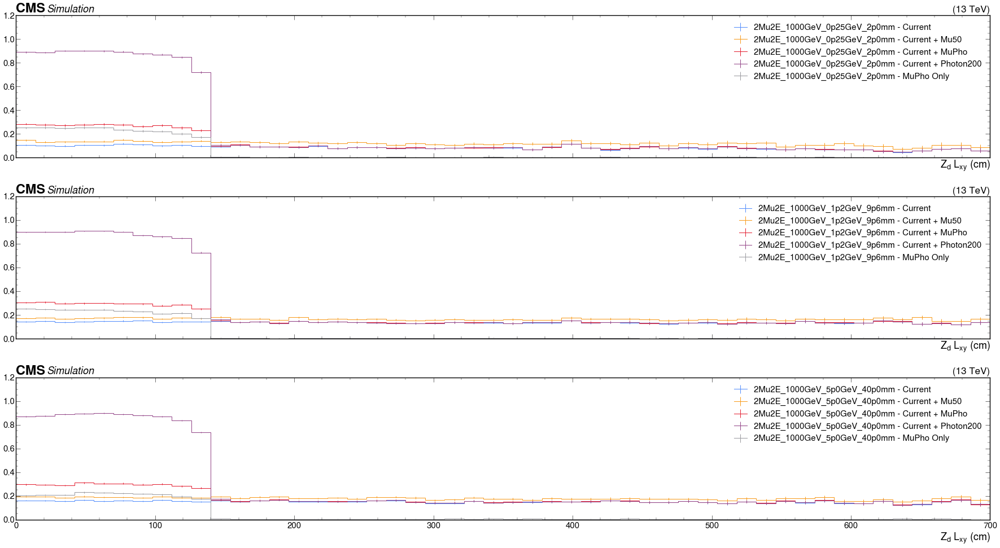

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals


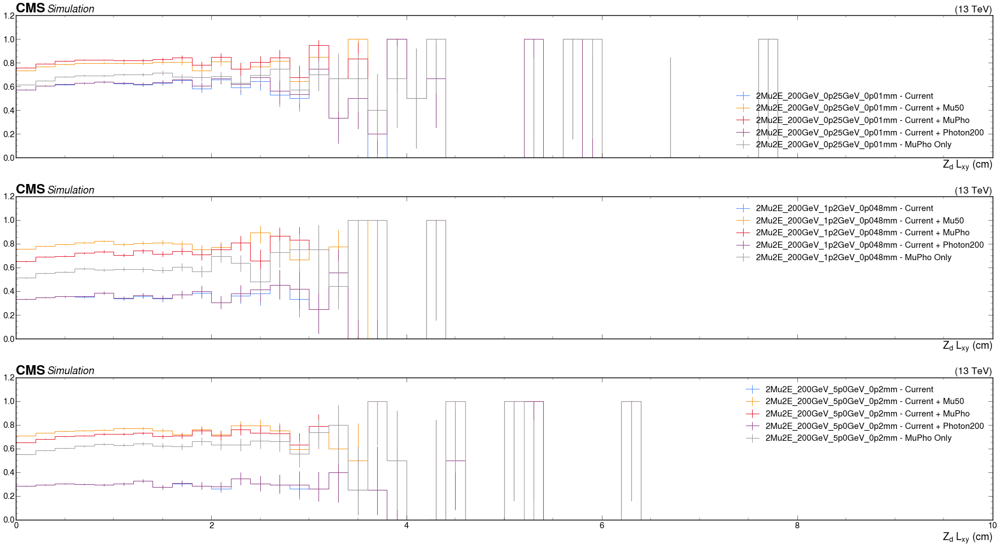

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals


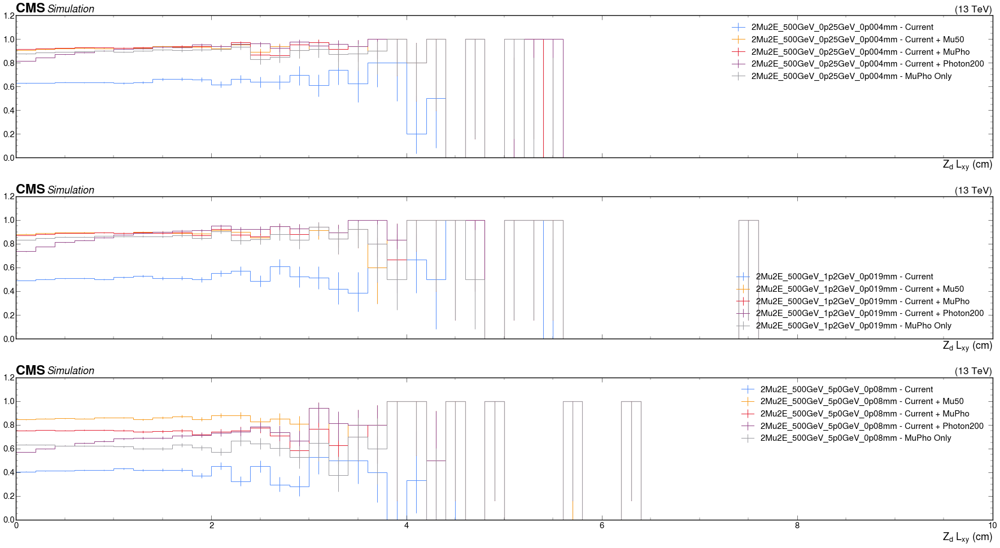

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals


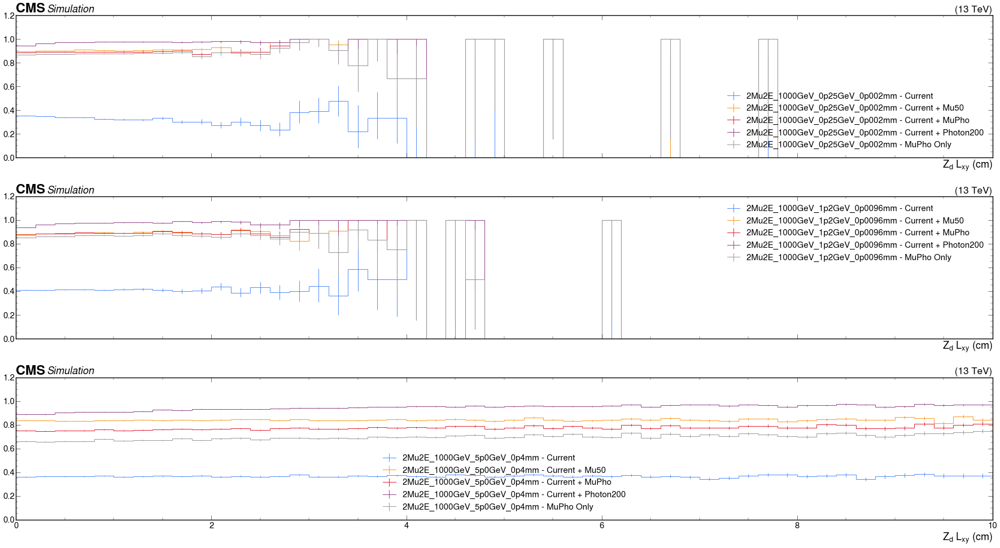

In [29]:
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples200,
    path=path,
    mb='200',
    prompt=False,
    electron=True,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=0,
    label_suffix='',
    denName='genAs_toE_lxy',
    passingCurrentTrigger="genAToEs_passingCurrentTrigger_lxy",
    passingCurrentPlusMu50="genAToEs_passingCurrentTriggerPlusMu50_lxy",
    passingCurrentPlusPho200="genAToEs_passingCurrentTriggerPlusPhoton200_lxy",
    passingCurrentPlusMuPho="genAToEs_passingCurrentTriggerPlusMuPho_lxy",
    passingMuPhoOnly="genAToEs_passingMuPhoOnly_lxy",
    maxRange=700,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples500,
    path=path,
    mb='500',
    prompt=False,
    electron=True,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=0,
    label_suffix='',
    denName='genAs_toE_lxy',
    passingCurrentTrigger="genAToEs_passingCurrentTrigger_lxy",
    passingCurrentPlusMu50="genAToEs_passingCurrentTriggerPlusMu50_lxy",
    passingCurrentPlusPho200="genAToEs_passingCurrentTriggerPlusPhoton200_lxy",
    passingCurrentPlusMuPho="genAToEs_passingCurrentTriggerPlusMuPho_lxy",
    passingMuPhoOnly="genAToEs_passingMuPhoOnly_lxy",
    maxRange=700,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples1000,
    path=path,
    mb='1000',
    prompt=False,
    electron=True,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=0,
    label_suffix='',
    denName='genAs_toE_lxy',
    passingCurrentTrigger="genAToEs_passingCurrentTrigger_lxy",
    passingCurrentPlusMu50="genAToEs_passingCurrentTriggerPlusMu50_lxy",
    passingCurrentPlusPho200="genAToEs_passingCurrentTriggerPlusPhoton200_lxy",
    passingCurrentPlusMuPho="genAToEs_passingCurrentTriggerPlusMuPho_lxy",
    passingMuPhoOnly="genAToEs_passingMuPhoOnly_lxy",
    maxRange=700,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples200,
    path=path,
    mb='200',
    prompt=True,
    electron=True,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=0,
    label_suffix='',
    denName='genAs_toE_lxy_lowRange',
    passingCurrentTrigger="genAToEs_passingCurrentTrigger_lxy_lowRange",
    passingCurrentPlusMu50="genAToEs_passingCurrentTriggerPlusMu50_lxy_lowRange",
    passingCurrentPlusPho200="genAToEs_passingCurrentTriggerPlusPhoton200_lxy_lowRange",
    passingCurrentPlusMuPho="genAToEs_passingCurrentTriggerPlusMuPho_lxy_lowRange",
    passingMuPhoOnly="genAToEs_passingMuPhoOnly_lxy_lowRange",
    maxRange=10,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples500,
    path=path,
    mb='500',
    prompt=True,
    electron=True,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=0,
    label_suffix='',
    denName='genAs_toE_lxy_lowRange',
    passingCurrentTrigger="genAToEs_passingCurrentTrigger_lxy_lowRange",
    passingCurrentPlusMu50="genAToEs_passingCurrentTriggerPlusMu50_lxy_lowRange",
    passingCurrentPlusPho200="genAToEs_passingCurrentTriggerPlusPhoton200_lxy_lowRange",
    passingCurrentPlusMuPho="genAToEs_passingCurrentTriggerPlusMuPho_lxy_lowRange",
    passingMuPhoOnly="genAToEs_passingMuPhoOnly_lxy_lowRange",
    maxRange=10,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples1000,
    path=path,
    mb='1000',
    prompt=True,
    electron=True,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=0,
    label_suffix='',
    denName='genAs_toE_lxy_lowRange',
    passingCurrentTrigger="genAToEs_passingCurrentTrigger_lxy_lowRange",
    passingCurrentPlusMu50="genAToEs_passingCurrentTriggerPlusMu50_lxy_lowRange",
    passingCurrentPlusPho200="genAToEs_passingCurrentTriggerPlusPhoton200_lxy_lowRange",
    passingCurrentPlusMuPho="genAToEs_passingCurrentTriggerPlusMuPho_lxy_lowRange",
    passingMuPhoOnly="genAToEs_passingMuPhoOnly_lxy_lowRange",
    maxRange=10,
)

## Plotting Trigger Turn on curves for $Z_d$ -> $\mu \mu$
##  efficiency = $N_{events}$[passing trigger & evt selection]/$N_{events}$

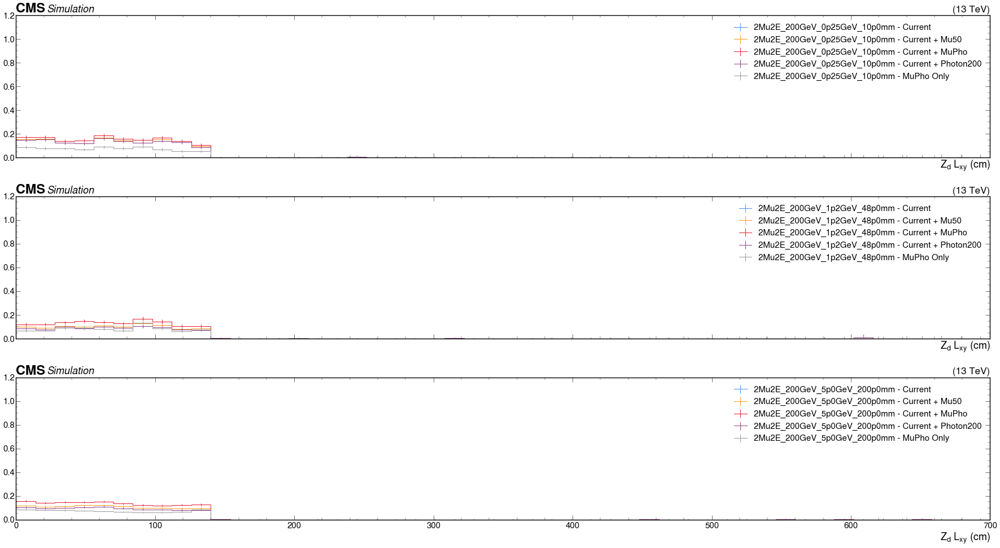

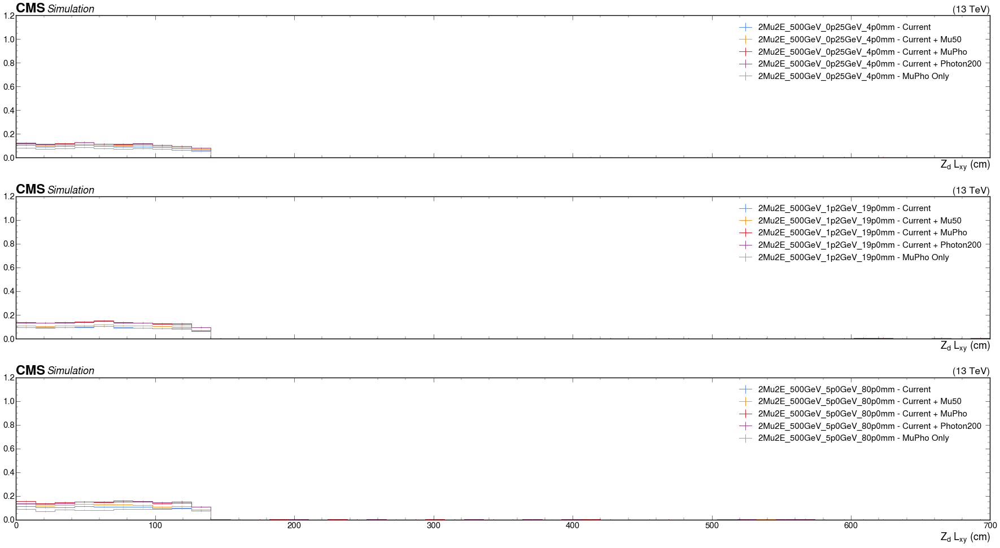

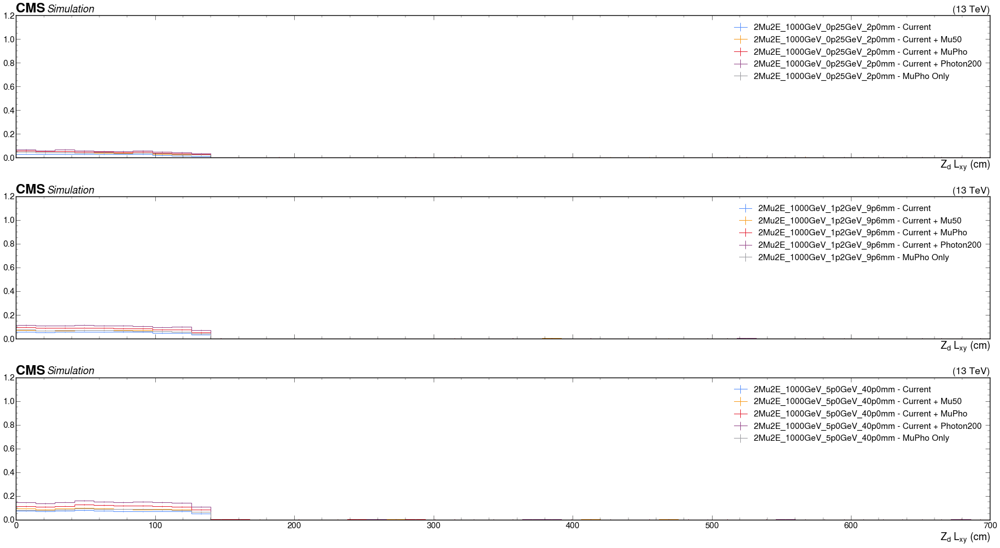

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals


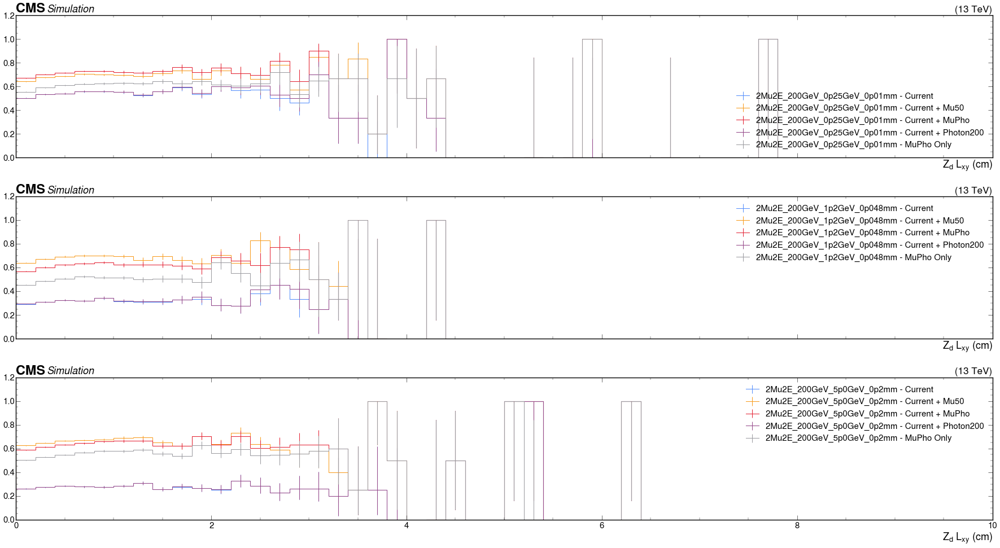

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals


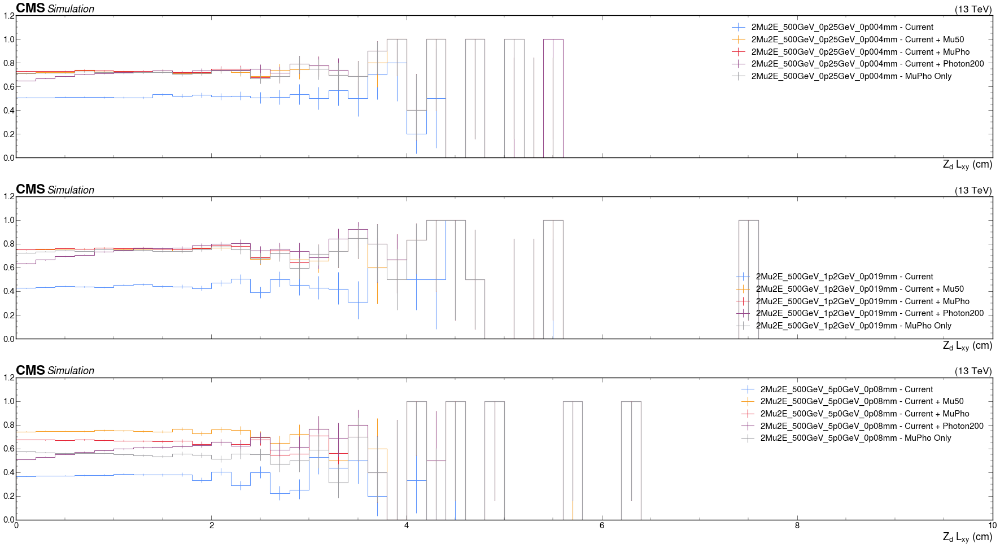

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals


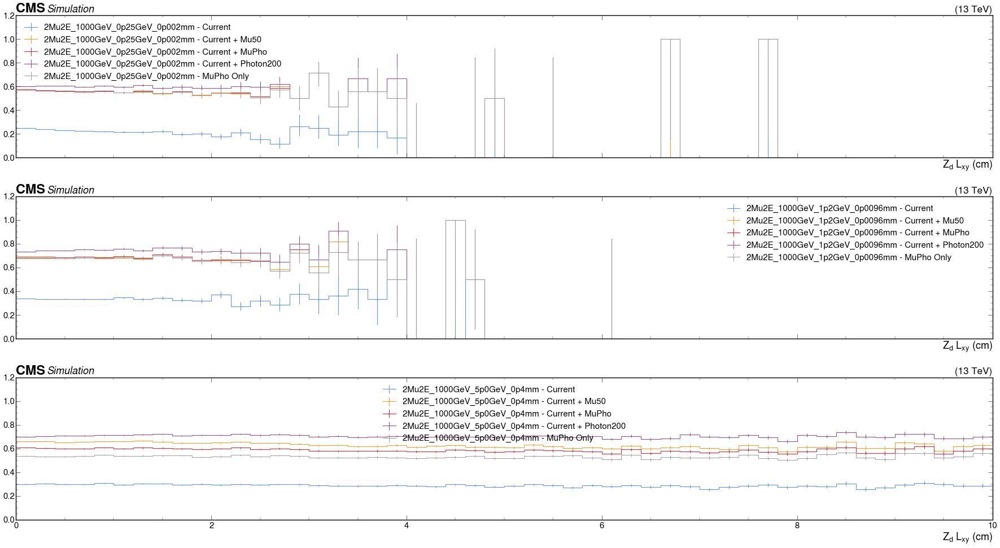

In [30]:
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples200,
    path=path,
    mb='200',
    prompt=False,
    electron=True,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=1,
    label_suffix='',
    denName='genAs_toE_lxy',
    passingCurrentTrigger="genAToEs_passingCurrentTrigger_lxy",
    passingCurrentPlusMu50="genAToEs_passingCurrentTriggerPlusMu50_lxy",
    passingCurrentPlusPho200="genAToEs_passingCurrentTriggerPlusPhoton200_lxy",
    passingCurrentPlusMuPho="genAToEs_passingCurrentTriggerPlusMuPho_lxy",
    passingMuPhoOnly="genAToEs_passingMuPhoOnly_lxy",
    maxRange=700,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples500,
    path=path,
    mb='500',
    prompt=False,
    electron=True,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=1,
    label_suffix='',
    denName='genAs_toE_lxy',
    passingCurrentTrigger="genAToEs_passingCurrentTrigger_lxy",
    passingCurrentPlusMu50="genAToEs_passingCurrentTriggerPlusMu50_lxy",
    passingCurrentPlusPho200="genAToEs_passingCurrentTriggerPlusPhoton200_lxy",
    passingCurrentPlusMuPho="genAToEs_passingCurrentTriggerPlusMuPho_lxy",
    passingMuPhoOnly="genAToEs_passingMuPhoOnly_lxy",
    maxRange=700,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples1000,
    path=path,
    mb='1000',
    prompt=False,
    electron=True,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=1,
    label_suffix='',
    denName='genAs_toE_lxy',
    passingCurrentTrigger="genAToEs_passingCurrentTrigger_lxy",
    passingCurrentPlusMu50="genAToEs_passingCurrentTriggerPlusMu50_lxy",
    passingCurrentPlusPho200="genAToEs_passingCurrentTriggerPlusPhoton200_lxy",
    passingCurrentPlusMuPho="genAToEs_passingCurrentTriggerPlusMuPho_lxy",
    passingMuPhoOnly="genAToEs_passingMuPhoOnly_lxy",
    maxRange=700,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples200,
    path=path,
    mb='200',
    prompt=True,
    electron=True,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=1,
    label_suffix='',
    denName='genAs_toE_lxy_lowRange',
    passingCurrentTrigger="genAToEs_passingCurrentTrigger_lxy_lowRange",
    passingCurrentPlusMu50="genAToEs_passingCurrentTriggerPlusMu50_lxy_lowRange",
    passingCurrentPlusPho200="genAToEs_passingCurrentTriggerPlusPhoton200_lxy_lowRange",
    passingCurrentPlusMuPho="genAToEs_passingCurrentTriggerPlusMuPho_lxy_lowRange",
    passingMuPhoOnly="genAToEs_passingMuPhoOnly_lxy_lowRange",
    maxRange=10,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples500,
    path=path,
    mb='500',
    prompt=True,
    electron=True,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=1,
    label_suffix='',
    denName='genAs_toE_lxy_lowRange',
    passingCurrentTrigger="genAToEs_passingCurrentTrigger_lxy_lowRange",
    passingCurrentPlusMu50="genAToEs_passingCurrentTriggerPlusMu50_lxy_lowRange",
    passingCurrentPlusPho200="genAToEs_passingCurrentTriggerPlusPhoton200_lxy_lowRange",
    passingCurrentPlusMuPho="genAToEs_passingCurrentTriggerPlusMuPho_lxy_lowRange",
    passingMuPhoOnly="genAToEs_passingMuPhoOnly_lxy_lowRange",
    maxRange=10,
)
plotTriggerTurnOnCurves(
    data=out,
    sampleNames=samples1000,
    path=path,
    mb='1000',
    prompt=True,
    electron=True,
    isLxy=True,
    channel_den_index=0,
    channel_num_index=1,
    label_suffix='',
    denName='genAs_toE_lxy_lowRange',
    passingCurrentTrigger="genAToEs_passingCurrentTrigger_lxy_lowRange",
    passingCurrentPlusMu50="genAToEs_passingCurrentTriggerPlusMu50_lxy_lowRange",
    passingCurrentPlusPho200="genAToEs_passingCurrentTriggerPlusPhoton200_lxy_lowRange",
    passingCurrentPlusMuPho="genAToEs_passingCurrentTriggerPlusMuPho_lxy_lowRange",
    passingMuPhoOnly="genAToEs_passingMuPhoOnly_lxy_lowRange",
    maxRange=10,
)

# $\Delta R$ Turn-on Curves

## Plotting Trigger Turn on curves for $Z_d$ -> $\mu \mu$
##  efficiency = $N_{events}$[passing trigger]/$N_{events}$

In [31]:
# Configuration
path = './TriggerEfficiencyPlots-dR'
if not os.path.exists(path):
    os.mkdir(path)

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

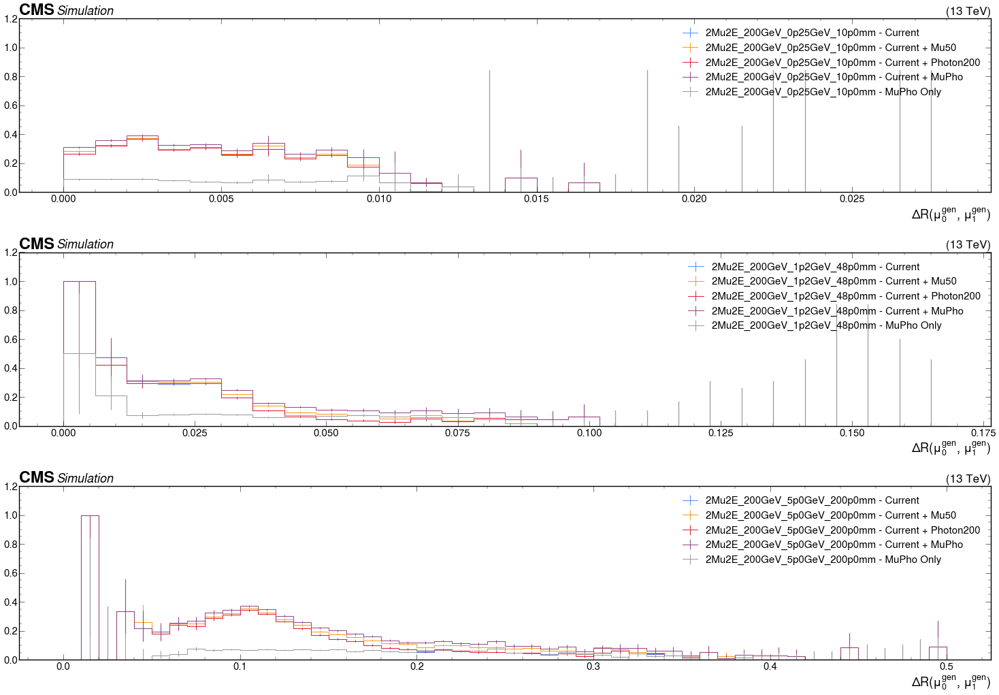

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

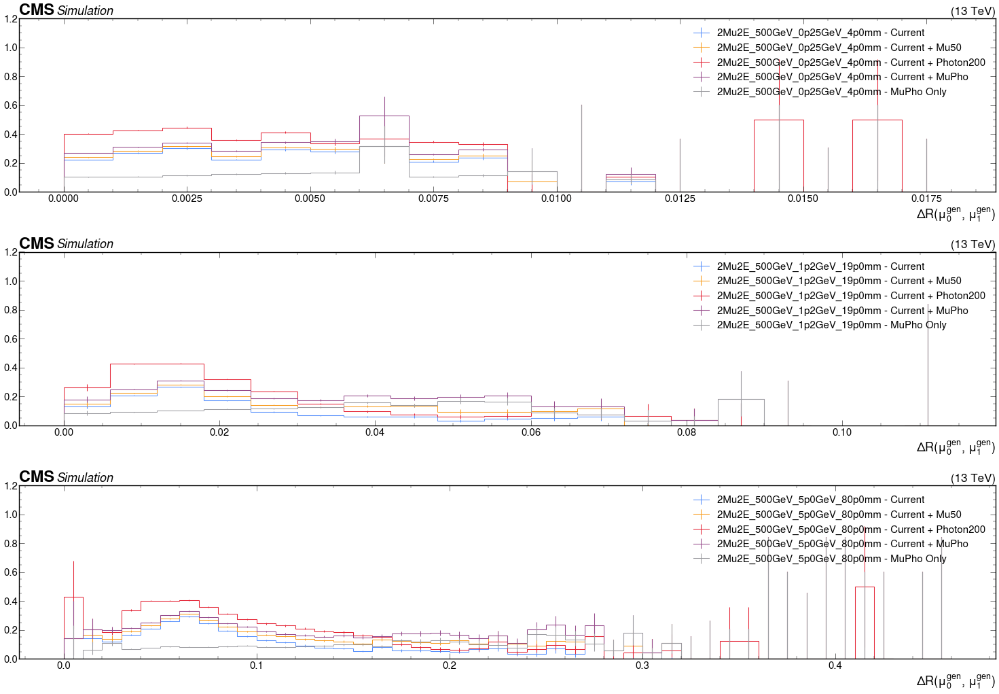

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

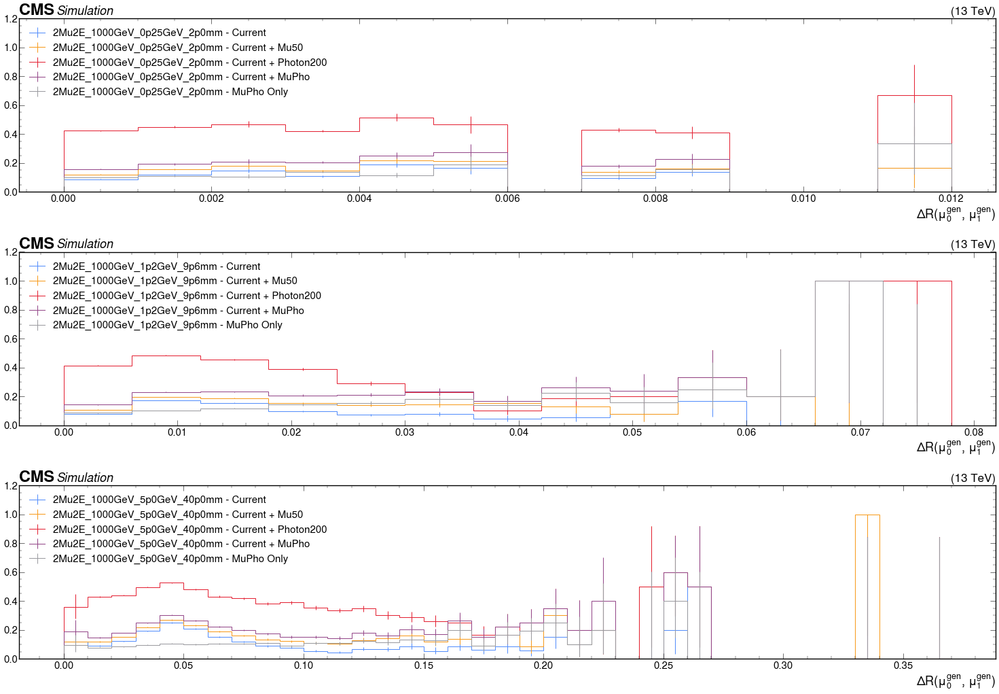

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

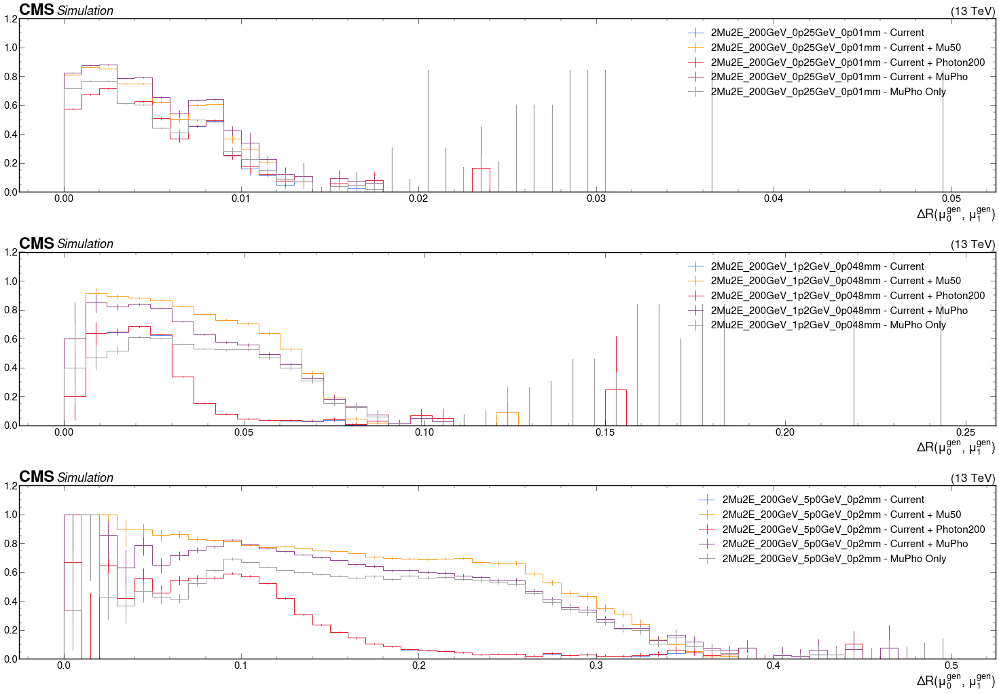

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

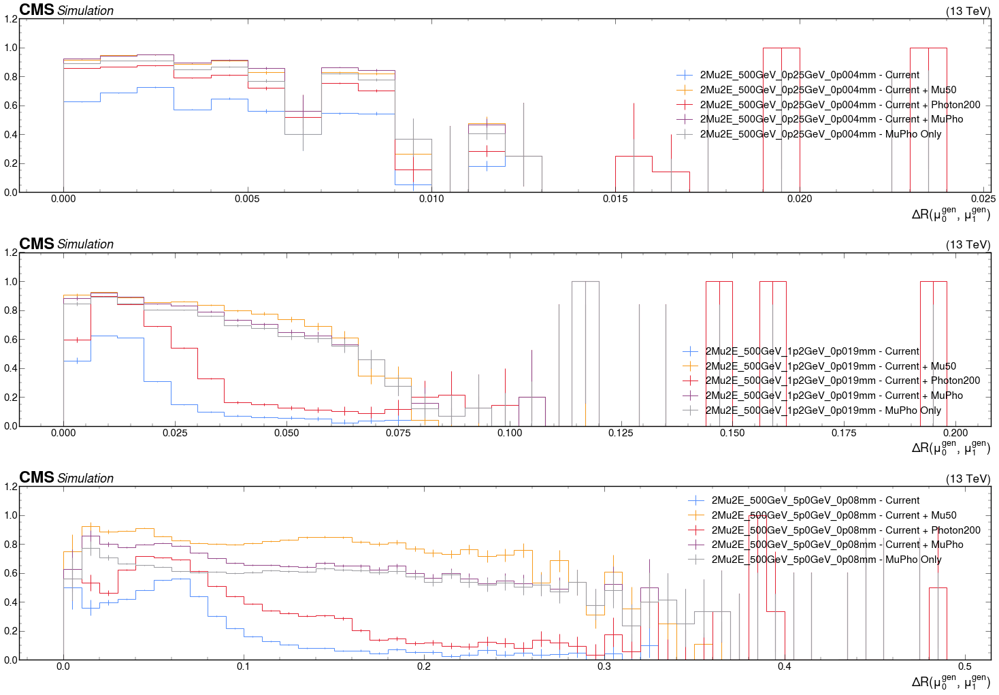

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

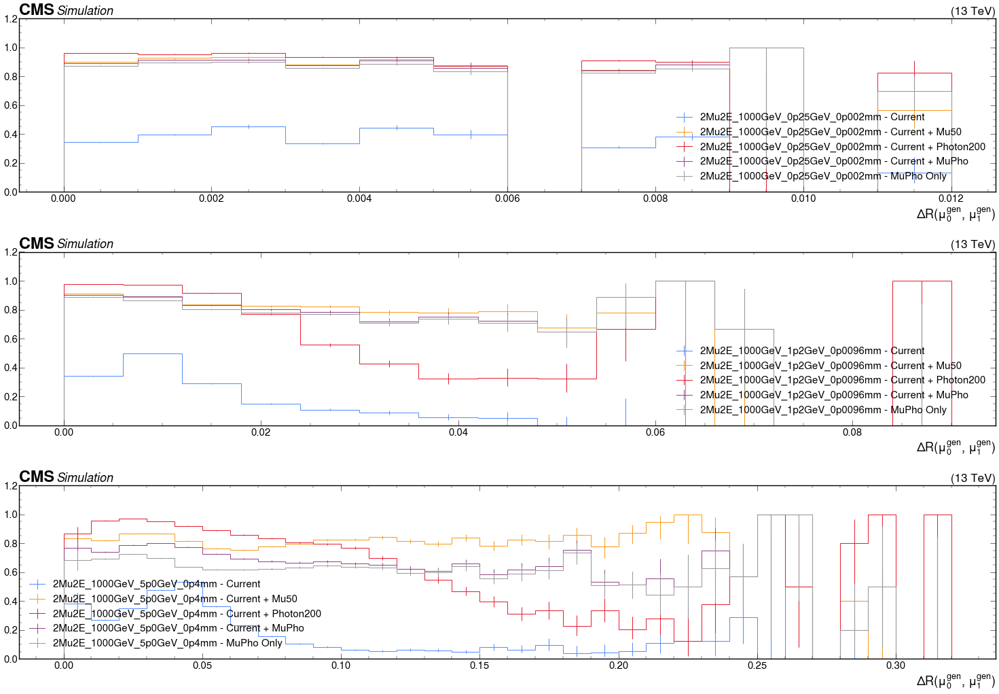

In [32]:
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples200, 
                   path=path,  
                   mb='200GeV', 
                   prompt=False, 
                   electron=False, 
                   numKey = 0, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples500, 
                   path=path,  
                   mb='500GeV', 
                   prompt=False, 
                   electron=False, 
                   numKey = 0, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples1000, 
                   path=path,  
                   mb='1000GeV', 
                   prompt=False, 
                   electron=False, 
                   numKey = 0, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples200, 
                   path=path,  
                   mb='200GeV', 
                   prompt=True, 
                   electron=False, 
                   numKey = 0, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples500, 
                   path=path,  
                   mb='500GeV', 
                   prompt=True, 
                   electron=False, 
                   numKey = 0, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples1000, 
                   path=path,  
                   mb='1000GeV', 
                   prompt=True, 
                   electron=False, 
                   numKey = 0, 
                   denKey = 0)


## Plotting Trigger Turn on curves for $Z_d$ -> $\mu \mu$
##  efficiency = $N_{events}$[passing trigger & Evt Sel]/$N_{events}$

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

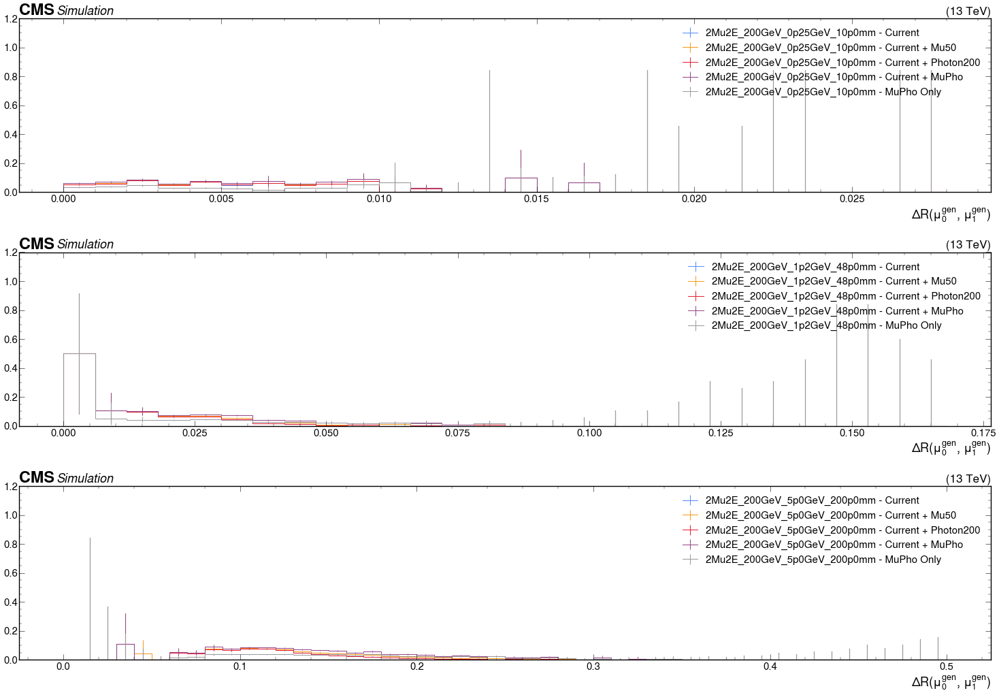

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

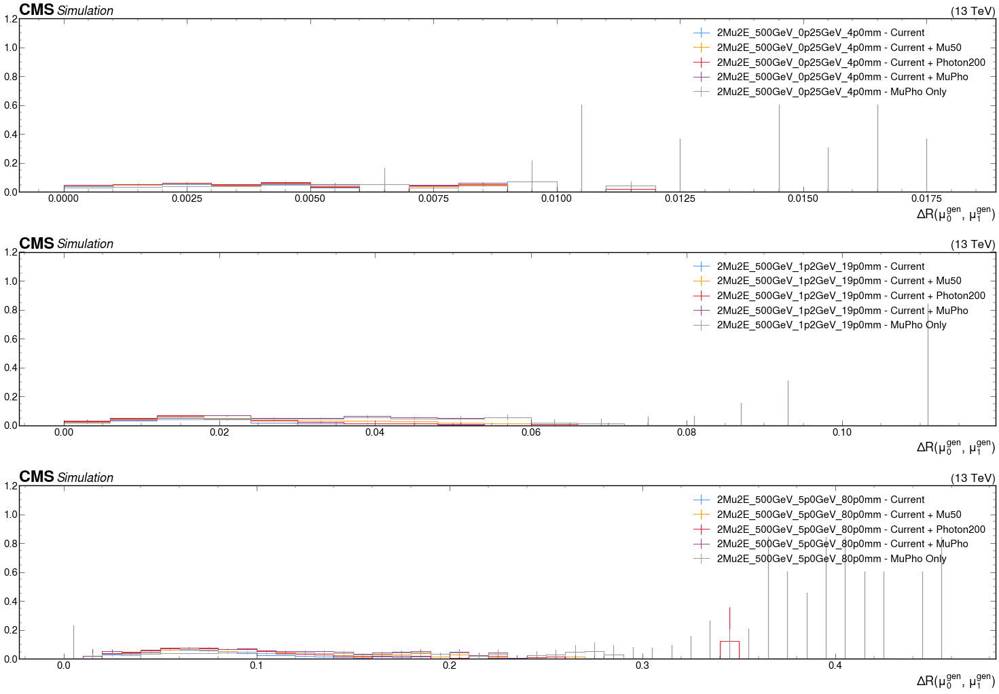

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

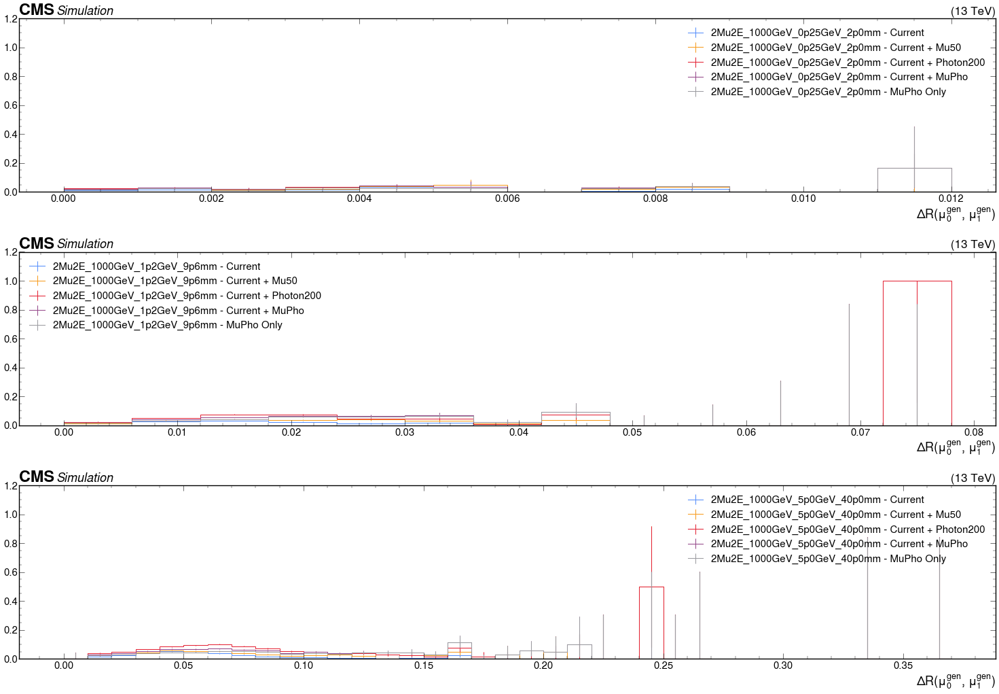

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

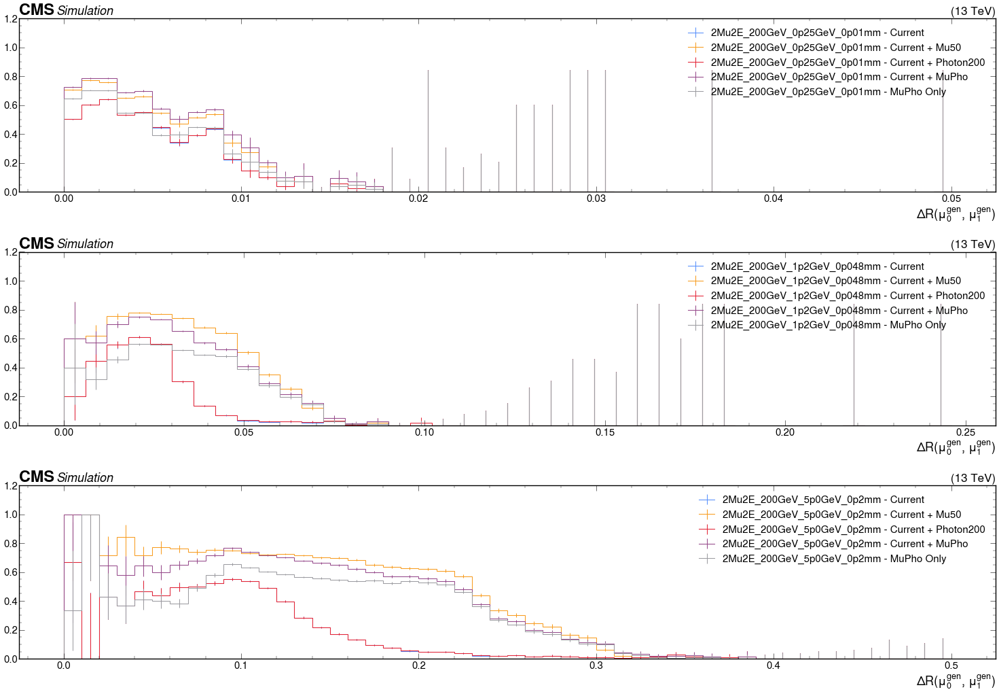

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

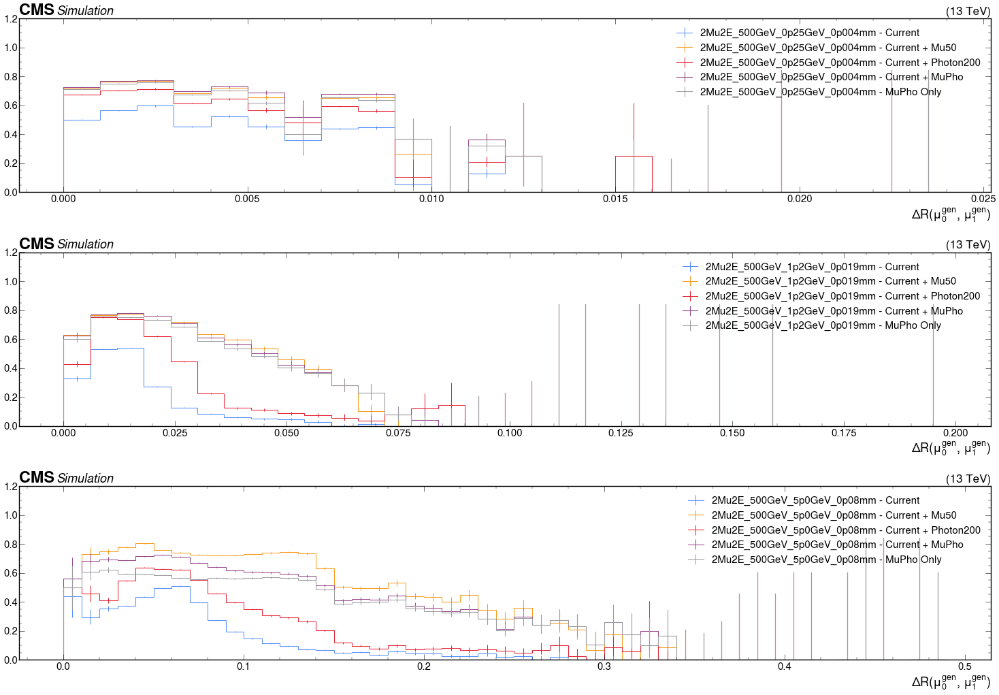

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

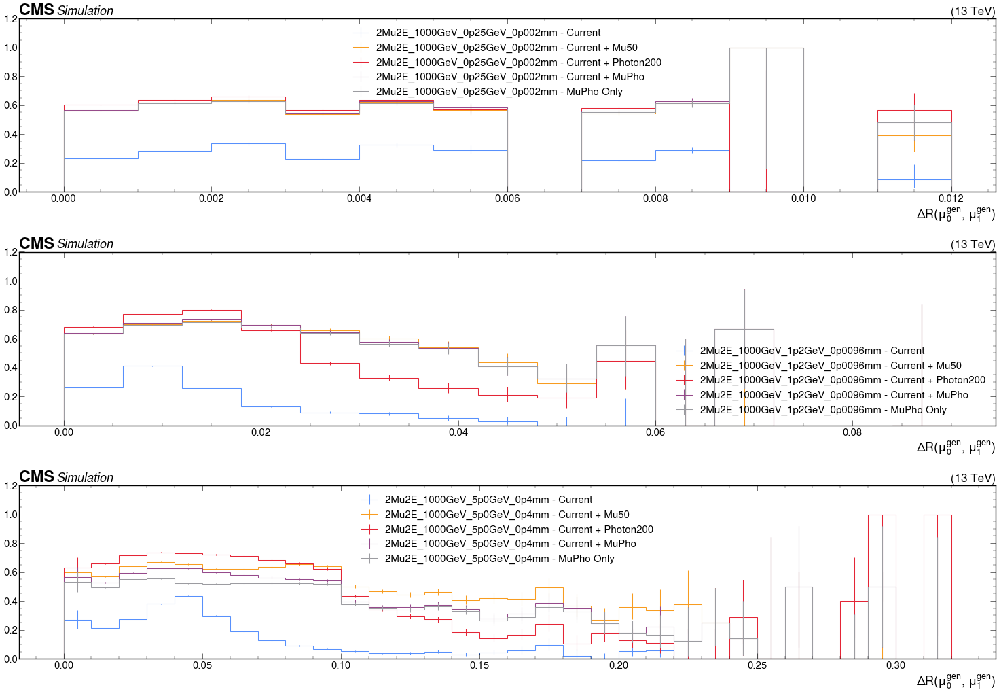

In [33]:
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples200, 
                   path=path,  
                   mb='200GeV', 
                   prompt=False, 
                   electron=False, 
                   numKey = 1, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples500, 
                   path=path,  
                   mb='500GeV', 
                   prompt=False, 
                   electron=False, 
                   numKey = 1, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples1000, 
                   path=path,  
                   mb='1000GeV', 
                   prompt=False, 
                   electron=False, 
                   numKey = 1, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples200, 
                   path=path,  
                   mb='200GeV', 
                   prompt=True, 
                   electron=False, 
                   numKey = 1, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples500, 
                   path=path,  
                   mb='500GeV', 
                   prompt=True, 
                   electron=False, 
                   numKey = 1, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples1000, 
                   path=path,  
                   mb='1000GeV', 
                   prompt=True, 
                   electron=False, 
                   numKey = 1, 
                   denKey = 0)


## Plotting Trigger Turn on curves for $Z_d$ -> ee
##  efficiency = $N_{events}$[passing trigger]/$N_{events}$

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

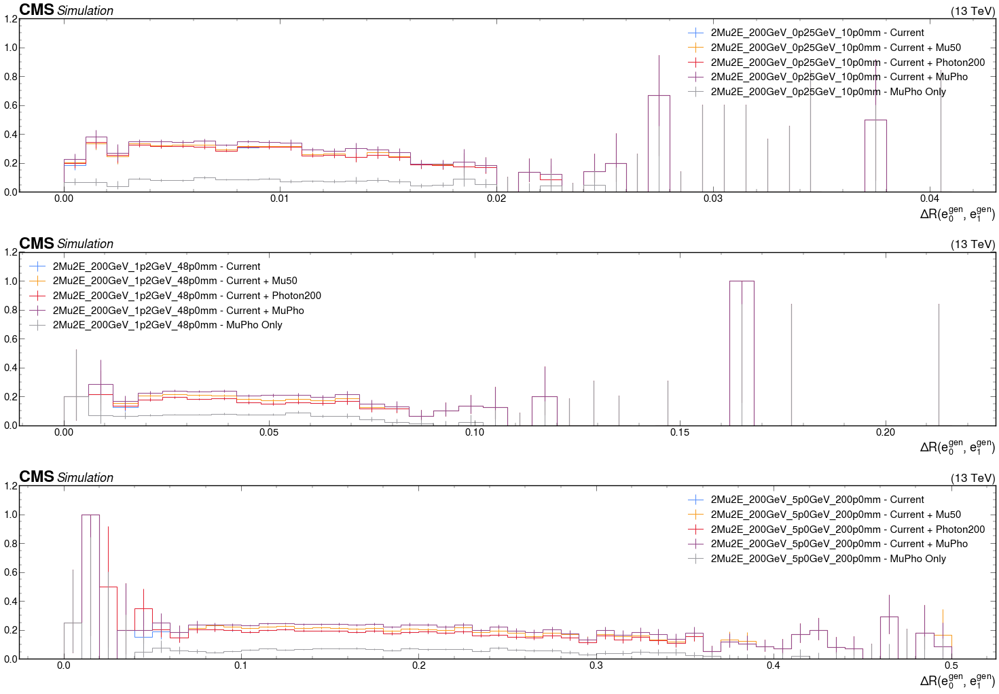

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

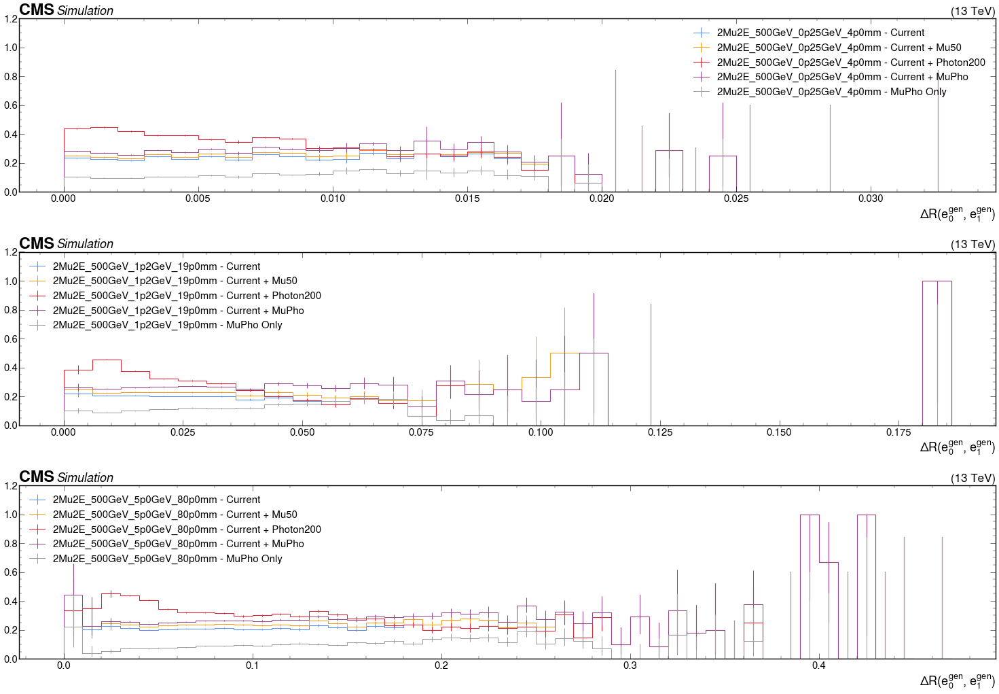

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

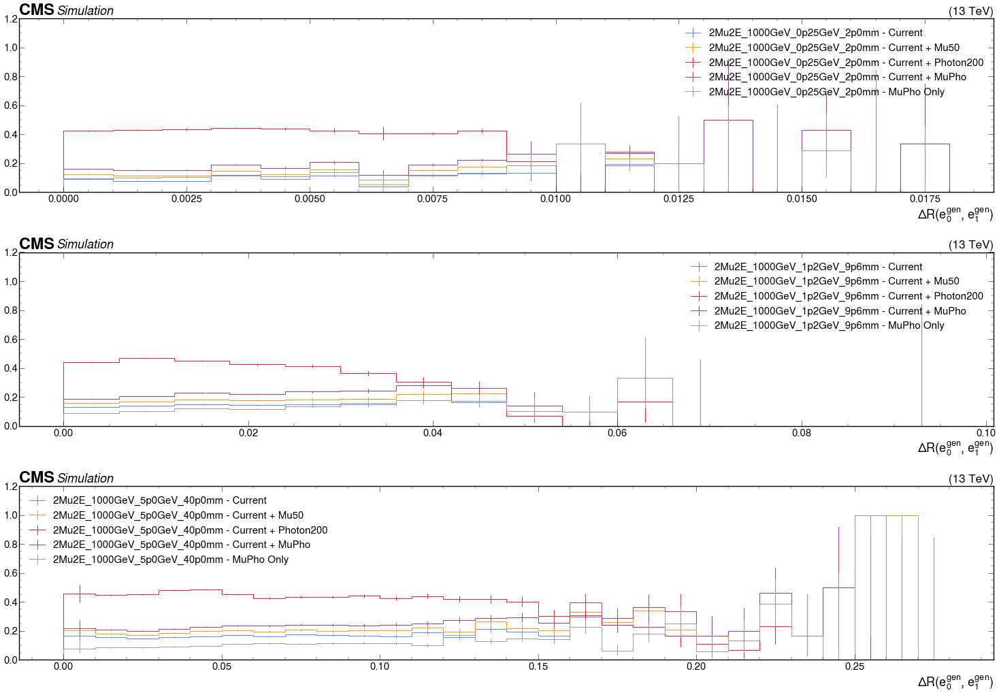

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

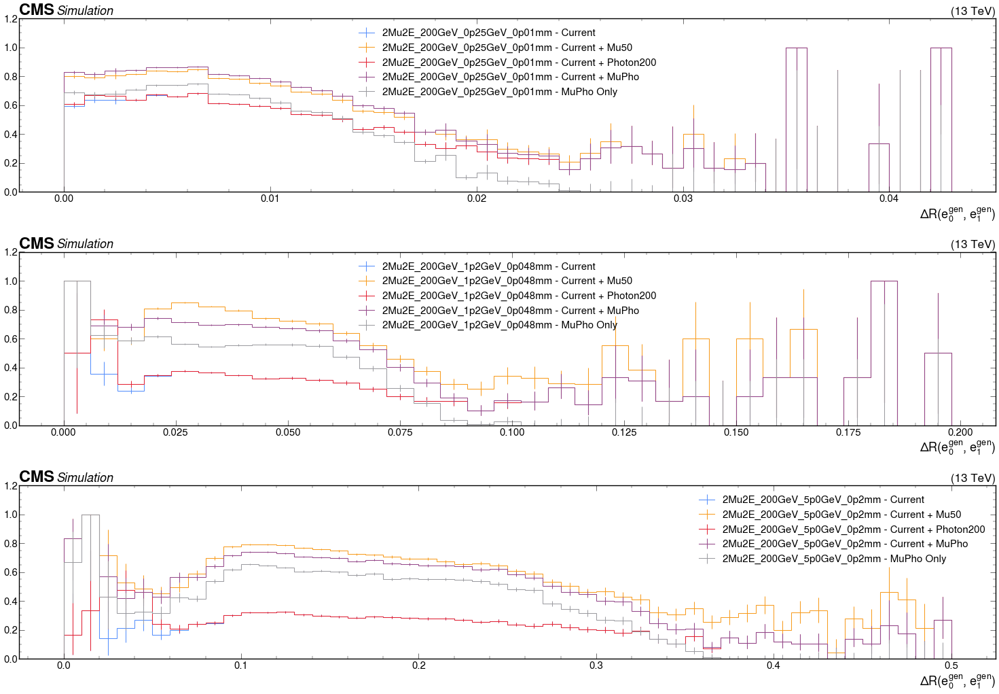

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

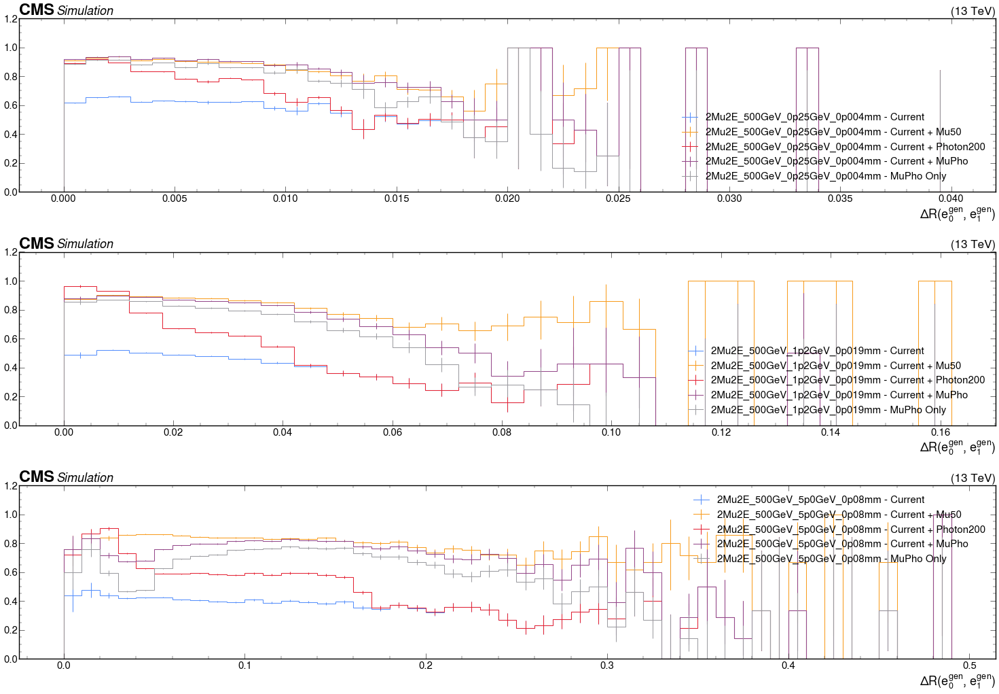

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

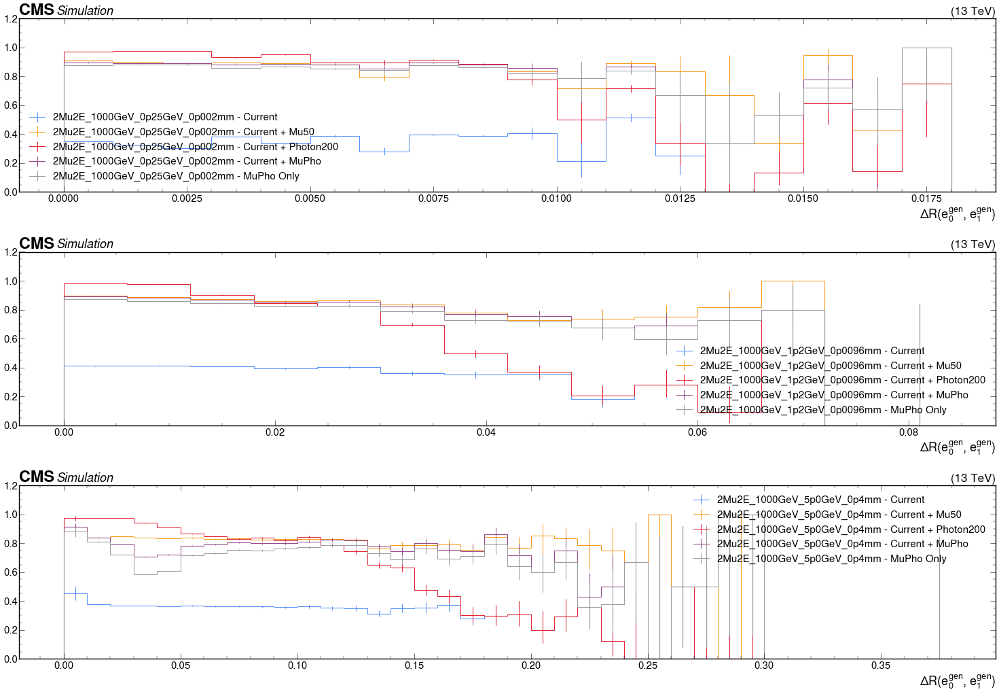

In [34]:
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples200, 
                   path=path,  
                   mb='200GeV', 
                   prompt=False, 
                   electron=True, 
                   numKey = 0, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples500, 
                   path=path,  
                   mb='500GeV', 
                   prompt=False, 
                   electron=True, 
                   numKey = 0, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples1000, 
                   path=path,  
                   mb='1000GeV', 
                   prompt=False, 
                   electron=True, 
                   numKey = 0, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples200, 
                   path=path,  
                   mb='200GeV', 
                   prompt=True, 
                   electron=True, 
                   numKey = 0, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples500, 
                   path=path,  
                   mb='500GeV', 
                   prompt=True, 
                   electron=True, 
                   numKey = 0, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples1000, 
                   path=path,  
                   mb='1000GeV', 
                   prompt=True, 
                   electron=True, 
                   numKey = 0, 
                   denKey = 0)


## Plotting Trigger Turn on curves for $Z_d$ -> ee
##  efficiency = $N_{events}$[passing trigger & Evt Sel]/$N_{events}$

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

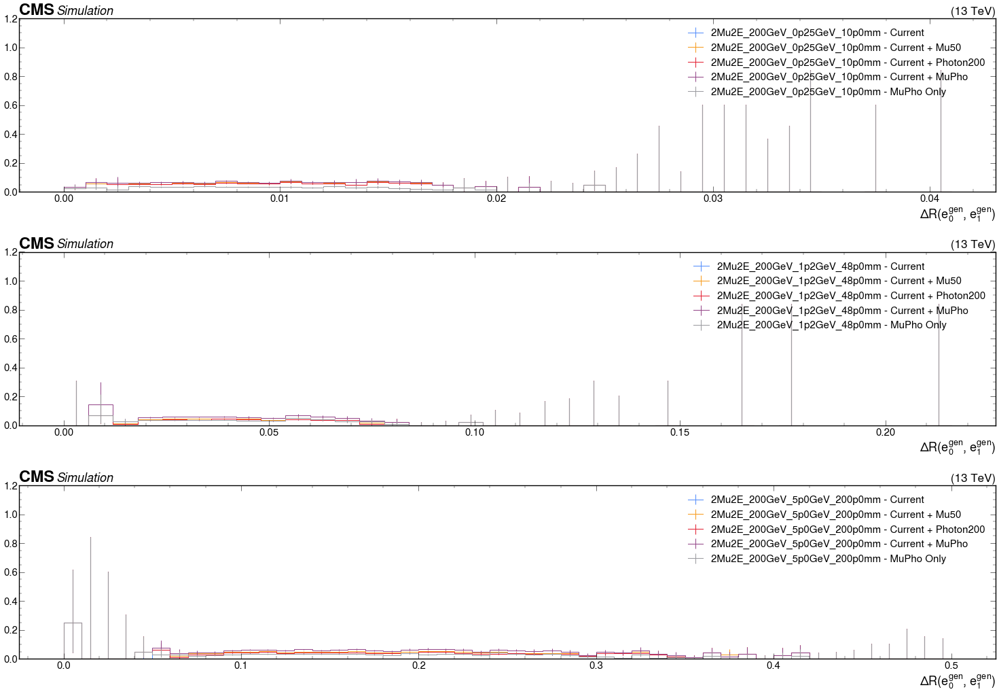

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

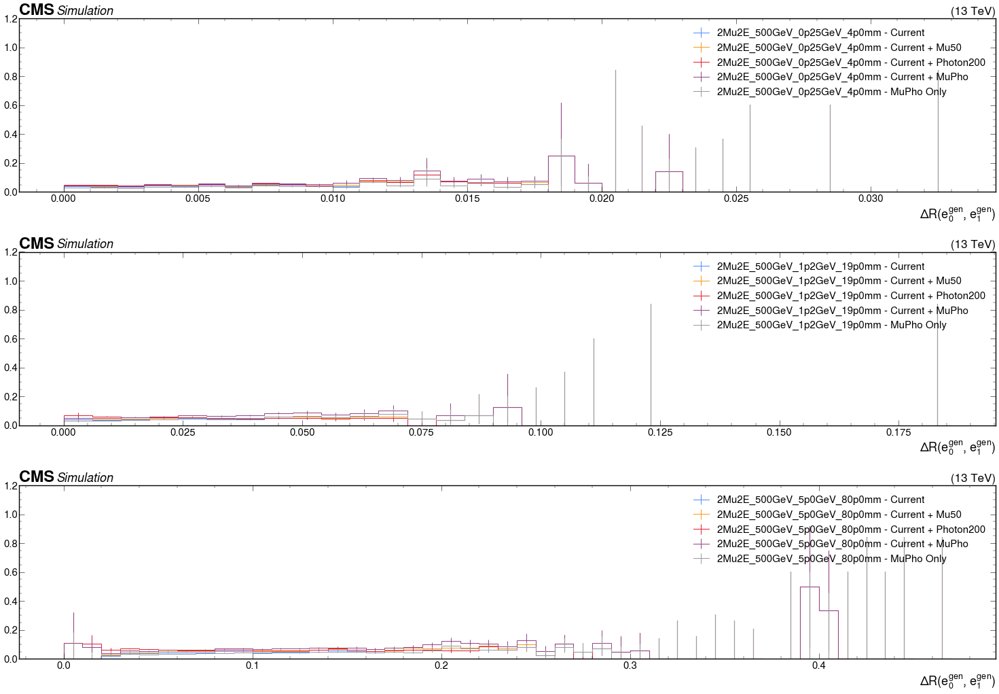

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

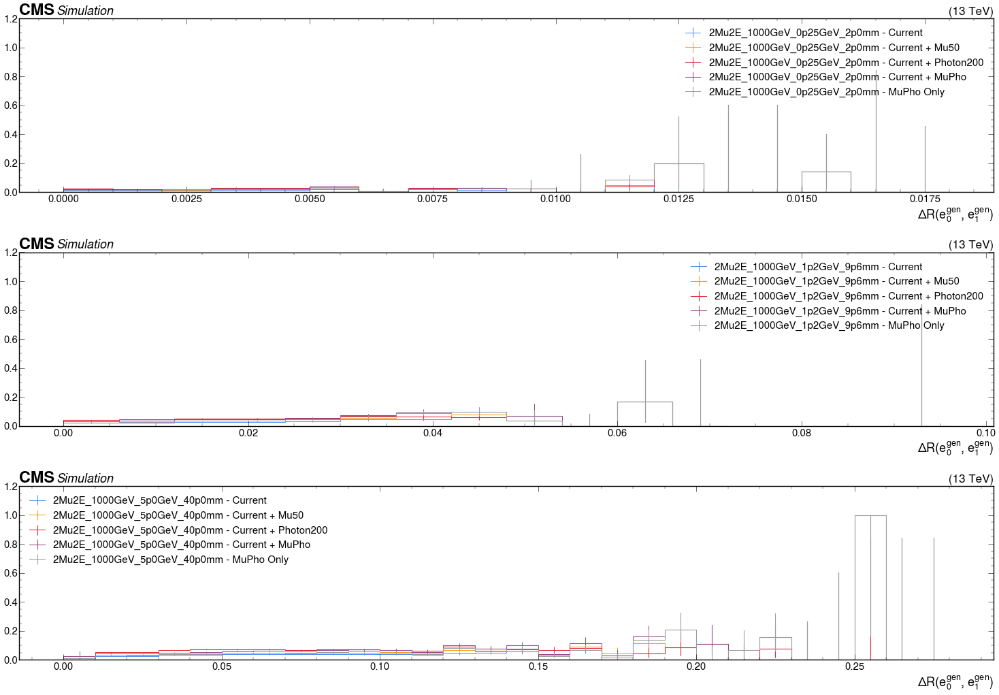

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

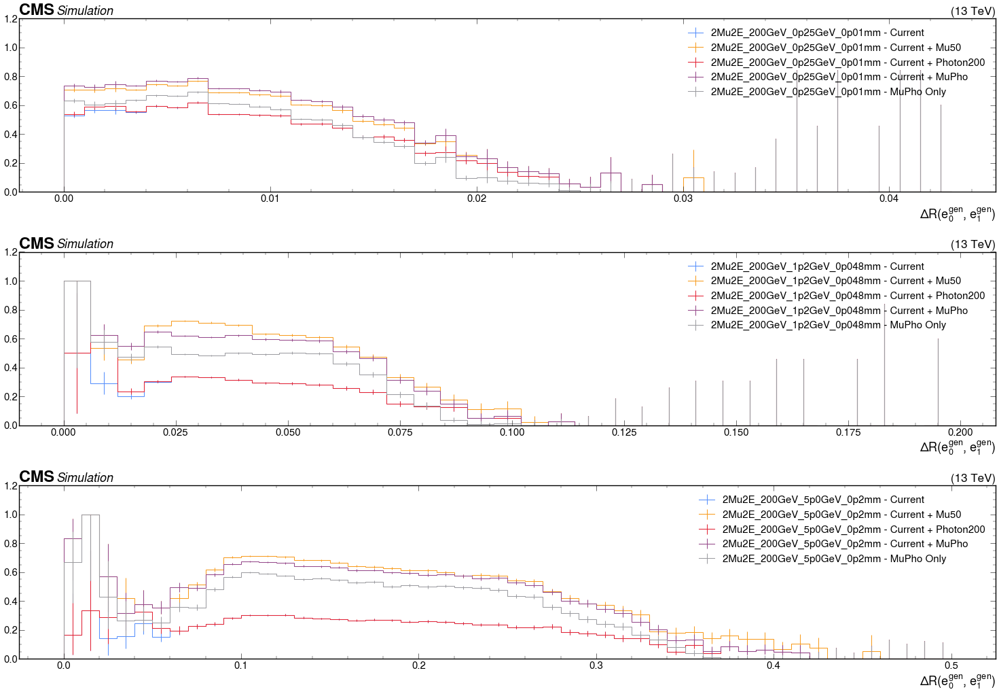

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

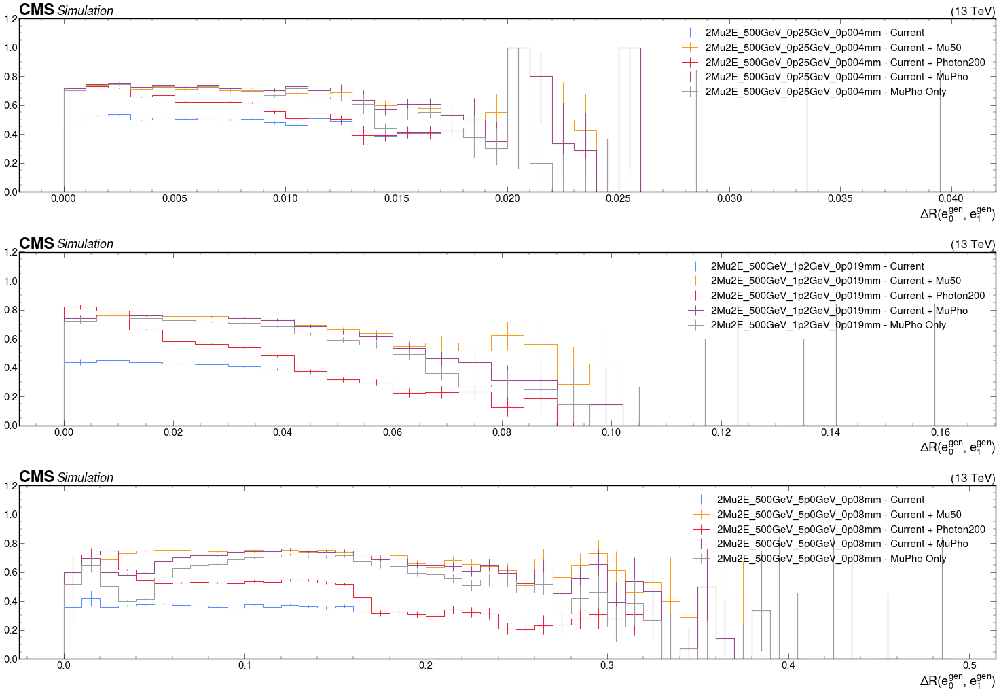

/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/utilities.py:144: RuntimeWarning: invalid value encountered in divide
  eff_values = num_vals/denom_vals
/home/cms-jovyan/SIDM/sidm/tools/u

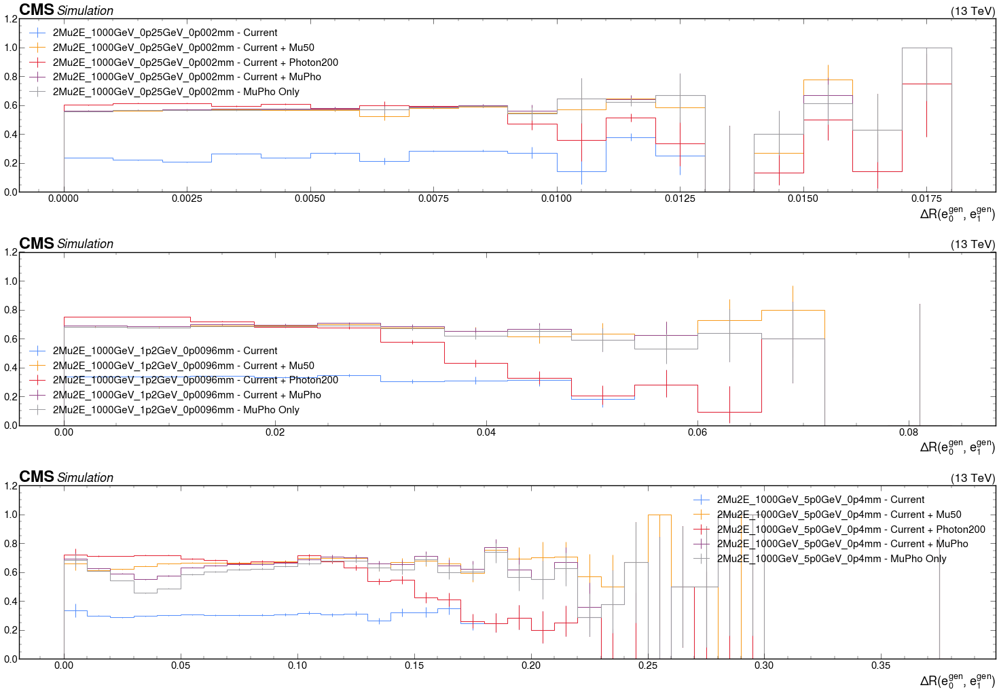

In [35]:
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples200, 
                   path=path,  
                   mb='200GeV', 
                   prompt=False, 
                   electron=True, 
                   numKey = 1, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples500, 
                   path=path,  
                   mb='500GeV', 
                   prompt=False, 
                   electron=True, 
                   numKey = 1, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples1000, 
                   path=path,  
                   mb='1000GeV', 
                   prompt=False, 
                   electron=True, 
                   numKey = 1, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples200, 
                   path=path,  
                   mb='200GeV', 
                   prompt=True, 
                   electron=True, 
                   numKey = 1, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples500, 
                   path=path,  
                   mb='500GeV', 
                   prompt=True, 
                   electron=True, 
                   numKey = 1, 
                   denKey = 0)
plotDRTurnOnCurves(data=out, 
                   sampleNames=samples1000, 
                   path=path,  
                   mb='1000GeV', 
                   prompt=True, 
                   electron=True, 
                   numKey = 1, 
                   denKey = 0)


# Conclusions

- **Mu50** provides some benefit, but only in the **prompt regime**. Its impact is minimal for displaced signals, so it is not considered useful for our analysis.

- **Photon200** is **highly effective** at the trigger level, especially for **higher bound-state masses** and for both `Zd → μμ` and `Zd → ee` channels. It offers good coverage across a **wide displacement range**.  
  However, much of its advantage is **significantly reduced** after applying our offline event selection.

- **MuGamma (Mu43NoFiltersNoVtx_Photon43_CaloIdL)** behaves similarly to Photon200 — it is most helpful at **large bound-state masses**.  
  That said, the **overall improvement** from MuGamma is **smaller** compared to Photon200.
